# Weeks 20–21 — Heston-Autoencoder Feature Engineering & CNN Experiments

## Setup
_Run this cell first. It pulls the shared repo code and imports it._

In [ ]:
# === Setup: pull shared code and import (run first) ===
from google.colab import drive; drive.mount("/content/drive")
import os
REPO_URL = "https://github.com/JosephOuyang/machine_learning_for_implied_volatility_forecasting.git"
REPO_DIR = "/content/repo"
if os.path.isdir(REPO_DIR):
    os.system(f"cd {REPO_DIR} && git pull -q")
else:
    os.system(f"git clone -q {REPO_URL} {REPO_DIR}")
import sys; sys.path.insert(0, REPO_DIR)
from shared.setup import *   # imports, seeds, logger, Drive mount

In [ ]:
# =============================================================================
# CELL 20.0 — Week 20 scaffold. Run FIRST (and again after any runtime reset).
#   Points run_dir_w20 at the folder for the Heston-autoencoder feature
#   engineering work (training dataset generation -> autoencoder training ->
#   deployment on the Jiang dataset). Uses a FIXED path (not a fresh
#   timestamped run) so a runtime disconnect just needs this cell re-run and
#   the location stays stable — same convention as Cells 18.0 / 19.0.
#
#   Week 20 scope: LHS-sampled Heston parameter sets -> simulated
#   (S, v) paths -> fixed-grid (moneyness, tau) price vectors -> call/put
#   autoencoder training -> deployment (interpolation onto the fixed grid +
#   encoding) on the Jiang American options dataset (runs/amer_with_labels.csv).
# =============================================================================
import os
from google.colab import drive

if not os.path.isdir("/content/drive/MyDrive"):
    drive.mount("/content/drive")

# ── EDIT THIS to the folder for Week 20 (create it fresh via start_run() the
# first time you run this project, e.g. start_run("week20_heston_autoencoder_features"),
# then hard-code the printed path here going forward) ─────────────────────────
run_dir_w20 = "/content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week20_heston_autoencoder_features/20260715-000000"
fig_dir_w20 = os.path.join(run_dir_w20, "figures")
os.makedirs(fig_dir_w20, exist_ok=True)

print("run_dir_w20:", run_dir_w20)
print("fig_dir_w20:", fig_dir_w20)
if os.path.isdir(run_dir_w20):
    contents = sorted(os.listdir(run_dir_w20))
    print("contents:", contents)
else:
    print("✗ run_dir_w20 not found — check the path / that Drive is mounted, "
          "or create it first with start_run('week20_heston_autoencoder_features').")

run_dir_w20: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week20_heston_autoencoder_features/20260715-000000
fig_dir_w20: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week20_heston_autoencoder_features/20260715-000000/figures
contents: ['cell201_daily_moneyness_tau_extent.csv', 'cell201_daily_option_counts.csv', 'figures']


Per-day option counts:
           n_calls       n_puts
count  1926.000000  1926.000000
mean    634.343718   658.159398
std     184.899474   207.418262
min       0.000000     0.000000
5%      380.000000   384.000000
25%     456.000000   457.000000
50%     666.000000   679.000000
75%     766.000000   798.000000
95%     931.000000  1019.750000
max    1159.000000  1315.000000


/tmp/ipykernel_5180/2137006264.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  extent = df.groupby(["date", "cp_flag"]).apply(daily_extent).reset_index()



Daily moneyness/tau coverage, by type (median across days):
            m_min     m_max     m_p05     m_p95  tau_min_days  tau_max_days  \
cp_flag                                                                       
C        0.806209  1.584355  0.881357  1.465863          23.0         913.0   
P        0.803533  1.577625  0.846298  1.411341          23.0         913.0   

         tau_p05_days  tau_p95_days  
cp_flag                              
C                23.0         910.5  
P                23.0         865.0  

C density (moneyness bins x tau-day bins), row=moneyness low->high:
[[ 13330  10807   5130   4373   4839   5358   4463   3393   3477   4114]
 [103740  24040   6831   5142   6275   6979   6251   3834   3823   3813]
 [220802  23051   8070   6166   6881   6719   5599   3316   3336   3227]
 [185958  18954   6598   5795   6051   5777   4812   2858   2846   2794]
 [122927  14781   5209   5040   5209   5012   4156   2475   2482   2403]
 [ 62023   9951   4562   4356   4523

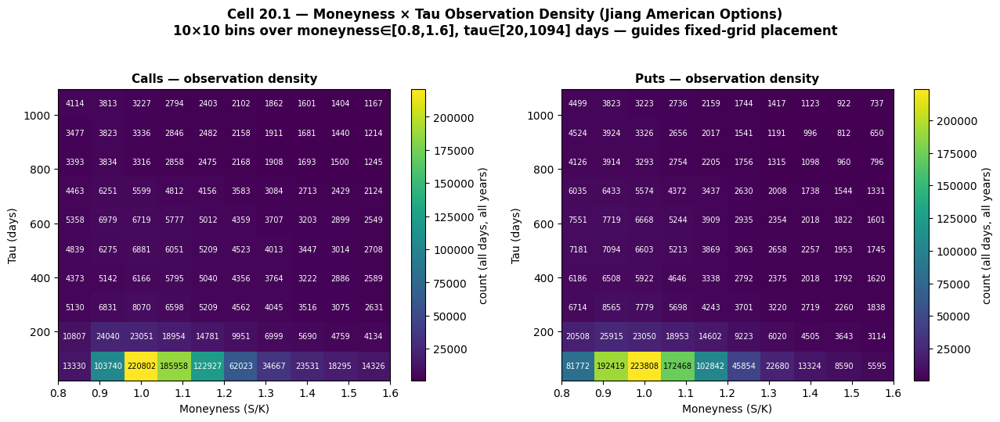

In [ ]:
# =============================================================================
# CELL 20.1 — Jiang dataset summary stats: per-day option counts and
#   moneyness/tau coverage, by call/put. Drives the fixed-grid design
#   (grid size and placement) for the Heston-autoencoder feature pipeline.
#   Depends only on Cell 20.0 (uses amer_with_labels.csv from the Week 15
#   pipeline — reload path is hardcoded below since it lives outside run_dir_w20).
#   Saves summary CSVs to run_dir_w20 and a density heatmap to fig_dir_w20.
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

AMER_LABELS_CSV = "runs/week15_jiang_replication/20260602-010249/amer_with_labels.csv"

df = pd.read_csv(AMER_LABELS_CSV, parse_dates=["date", "exdate"])

# --- counts per day, by option type ---
counts = df.groupby(["date", "cp_flag"]).size().unstack(fill_value=0)
counts.columns = ["n_calls", "n_puts"]

counts_describe = counts.describe(percentiles=[.05, .25, .5, .75, .95])
print("Per-day option counts:")
print(counts_describe)

# --- moneyness / tau coverage per day, by option type ---
def daily_extent(g):
    return pd.Series({
        "m_min": g["moneyness"].min(), "m_max": g["moneyness"].max(),
        "m_p05": g["moneyness"].quantile(.05), "m_p95": g["moneyness"].quantile(.95),
        "tau_min_days": g["tau"].min()*365, "tau_max_days": g["tau"].max()*365,
        "tau_p05_days": g["tau"].quantile(.05)*365, "tau_p95_days": g["tau"].quantile(.95)*365,
    })

extent = df.groupby(["date", "cp_flag"]).apply(daily_extent).reset_index()
extent_medians = extent.groupby("cp_flag").median(numeric_only=True)
print("\nDaily moneyness/tau coverage, by type (median across days):")
print(extent_medians)

# --- 2D density: where are calls/puts actually concentrated? ---
density_grids = {}
m_edges = t_edges = None
for cp in ["C", "P"]:
    sub = df[df.cp_flag == cp]
    hist, m_edges, t_edges = np.histogram2d(
        sub["moneyness"], sub["tau"]*365, bins=[10, 10],
        range=[[0.8, 1.6], [20, 1094]]
    )
    density_grids[cp] = hist
    print(f"\n{cp} density (moneyness bins x tau-day bins), row=moneyness low->high:")
    print(hist.astype(int))

# --- Save everything: raw daily tables, the two summary tables, and the density grids ---
counts.to_csv(os.path.join(run_dir_w20, "cell201_daily_option_counts.csv"))
extent.to_csv(os.path.join(run_dir_w20, "cell201_daily_moneyness_tau_extent.csv"), index=False)
counts_describe.to_csv(os.path.join(run_dir_w20, "cell201_counts_describe_summary.csv"))
extent_medians.to_csv(os.path.join(run_dir_w20, "cell201_extent_medians_by_cp.csv"))

for cp in ["C", "P"]:
    density_df = pd.DataFrame(
        density_grids[cp],
        index=[f"m_{m:.3f}" for m in 0.5*(m_edges[:-1]+m_edges[1:])],
        columns=[f"tau_{t:.0f}d" for t in 0.5*(t_edges[:-1]+t_edges[1:])],
    )
    density_df.to_csv(os.path.join(run_dir_w20, f"cell201_density_grid_{cp}.csv"))

print("\nSaved:")
for fname in ["cell201_daily_option_counts.csv", "cell201_daily_moneyness_tau_extent.csv",
              "cell201_counts_describe_summary.csv", "cell201_extent_medians_by_cp.csv",
              "cell201_density_grid_C.csv", "cell201_density_grid_P.csv"]:
    print(" ", os.path.join(run_dir_w20, fname))

# --- Heatmap visualization: calls vs puts density over moneyness x tau ---
fig, axes = plt.subplots(1, 2, figsize=(13, 5.2))

for ax, cp in zip(axes, ["C", "P"]):
    hist = density_grids[cp]
    im = ax.imshow(
        hist.T,                      # transpose: rows=tau, cols=moneyness for a natural x/y read
        origin="lower",
        aspect="auto",
        extent=[m_edges[0], m_edges[-1], t_edges[0], t_edges[-1]],
        cmap="viridis",
    )
    m_centers = 0.5 * (m_edges[:-1] + m_edges[1:])
    t_centers = 0.5 * (t_edges[:-1] + t_edges[1:])
    for i, m in enumerate(m_centers):
        for j, t in enumerate(t_centers):
            val = int(hist[i, j])
            if val > 0:
                ax.text(m, t, str(val), ha="center", va="center",
                        fontsize=7, color="white" if val < hist.max()*0.6 else "black")

    ax.set_xlabel("Moneyness (S/K)", fontsize=10)
    ax.set_ylabel("Tau (days)", fontsize=10)
    ax.set_title(f"{'Calls' if cp=='C' else 'Puts'} — observation density",
                 fontsize=11, fontweight="bold")
    fig.colorbar(im, ax=ax, label="count (all days, all years)")

fig.suptitle("Cell 20.1 — Moneyness × Tau Observation Density (Jiang American Options)\n"
             "10×10 bins over moneyness∈[0.8,1.6], tau∈[20,1094] days — guides fixed-grid placement",
             fontsize=12, fontweight="bold", y=1.03)
fig.tight_layout()

out_png = os.path.join(fig_dir_w20, "cell201_moneyness_tau_density_heatmap.png")
fig.savefig(out_png, dpi=150, bbox_inches="tight")
print("Saved:", out_png)
plt.show()

Reloaded daily count summary:
           n_calls       n_puts
count  1926.000000  1926.000000
mean    634.343718   658.159398
std     184.899474   207.418262
min       0.000000     0.000000
5%      380.000000   384.000000
25%     456.000000   457.000000
50%     666.000000   679.000000
75%     766.000000   798.000000
95%     931.000000  1019.750000
max    1159.000000  1315.000000

Reloaded extent medians by type:
            m_min     m_max     m_p05     m_p95  tau_min_days  tau_max_days  \
cp_flag                                                                       
C        0.806209  1.584355  0.881357  1.465863          23.0         913.0   
P        0.803533  1.577625  0.846298  1.411341          23.0         913.0   

         tau_p05_days  tau_p95_days  
cp_flag                              
C                23.0         910.5  
P                23.0         865.0  

25th pct daily count — calls: 456, puts: 457
Reliable-coverage floor (min of the two): 456
Chosen GRID_SIZE (per o

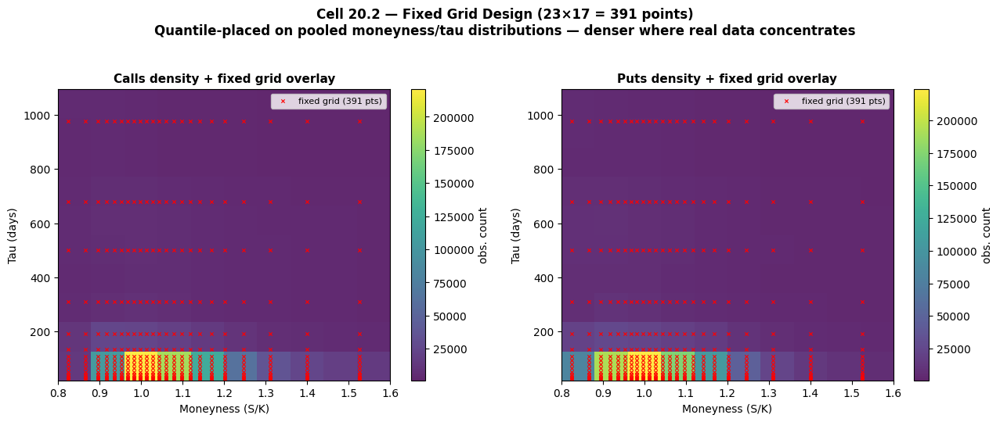


FIXED_GRID is now defined: shape (391, 2) (columns: moneyness, tau_days)
Reuse this exact array for:
  - every synthetic Heston training price vector (Cell 20.3+)
  - every deployment-time interpolation onto the Jiang dataset (Cell 20.x)


In [ ]:
# =============================================================================
# CELL 20.2 — Fixed moneyness×tau grid design (size + placement), for the
#   Heston-autoencoder price vectors. Depends on Cell 20.1's saved outputs
#   (reads back cell201_* CSVs from run_dir_w20, plus the raw amer_with_labels
#   dataframe `df` already in memory from 20.1).
#
#   Grid SIZE: chosen from the lower tail of daily option counts (per type)
#   so that most trading days can fill the grid from real quotes/quotes-derived
#   interpolation without heavy extrapolation — NOT the median/typical count,
#   since deployment needs to work reliably even on thinner days.
#
#   Grid PLACEMENT: quantile-based per axis (moneyness, tau), using the pooled
#   distribution of ALL observations across ALL days. This concentrates grid
#   points exactly where the data has real mass (dense near ATM / short tau)
#   and thins them out in the sparse tails — following the density heatmap
#   from Cell 20.1, without needing a hand-tuned non-uniform bin scheme.
#
#   Same grid is reused for both call and put autoencoders (only the VALUES
#   at each grid coordinate differ between call/put price vectors, not the
#   coordinates themselves — keeps deployment interpolation code identical
#   for both option types).
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# ── Reload Cell 20.1 outputs (safe even if this is a fresh session) ──────────
counts = pd.read_csv(os.path.join(run_dir_w20, "cell201_daily_option_counts.csv"),
                     index_col=0, parse_dates=True)
counts_describe = pd.read_csv(os.path.join(run_dir_w20, "cell201_counts_describe_summary.csv"),
                              index_col=0)
extent_medians = pd.read_csv(os.path.join(run_dir_w20, "cell201_extent_medians_by_cp.csv"),
                             index_col=0)

print("Reloaded daily count summary:")
print(counts_describe)
print("\nReloaded extent medians by type:")
print(extent_medians)

# =============================================================================
# STEP 1 — Grid size (G): one shared size for both call and put grids.
# =============================================================================
# Use the 25th percentile of daily counts per type as the "reliable coverage"
# floor — i.e. a size that ~75% of days can fill from real quotes without
# leaning heavily on interpolation/extrapolation. Take the min across C/P so
# a single grid size works safely for both option types.
p25_calls = counts_describe.loc["25%", "n_calls"]
p25_puts  = counts_describe.loc["25%", "n_puts"]
reliable_floor = int(np.floor(min(p25_calls, p25_puts)))

# Leave headroom below that floor (don't max it out) — round down to a clean
# number for readability. Also enforce a sane minimum so the autoencoder has
# enough surface resolution to be worth compressing, and a sane maximum so
# thin days don't force excessive extrapolation.
GRID_SIZE = int(np.clip(round(reliable_floor * 0.85 / 10) * 10, 80, 400))

print(f"\n25th pct daily count — calls: {p25_calls:.0f}, puts: {p25_puts:.0f}")
print(f"Reliable-coverage floor (min of the two): {reliable_floor}")
print(f"Chosen GRID_SIZE (per option type): {GRID_SIZE}")

# =============================================================================
# STEP 2 — Grid placement: quantile-based per axis, pooled across all days
#   and both option types (moneyness/tau ranges are governed by the market,
#   not by call vs put — using both keeps one shared grid usable for either).
# =============================================================================
# Split grid budget between the two axes. A full 2D grid would need
# n_moneyness x n_tau = GRID_SIZE points arranged as a Cartesian product,
# which keeps interpolation well-defined (griddata works on scattered 2D
# points regardless, but a structured product grid is easier to reason about
# and visualize). Use roughly sqrt-balanced axis sizes.
n_moneyness = int(round(np.sqrt(GRID_SIZE * 1.3)))   # slightly more moneyness resolution
n_tau       = int(round(GRID_SIZE / n_moneyness))
GRID_SIZE_ACTUAL = n_moneyness * n_tau

print(f"\nAxis split: {n_moneyness} moneyness points x {n_tau} tau points "
      f"= {GRID_SIZE_ACTUAL} grid points (target was {GRID_SIZE})")

# Pooled marginal distributions (all days, all years, both C and P)
pooled_moneyness = df["moneyness"].values
pooled_tau_days  = (df["tau"] * 365).values

# Quantile-spaced coordinates on each axis — this naturally places more grid
# points where the pooled data has more mass (e.g. denser near moneyness=1.0
# and short tau), and fewer where data is sparse (tails), matching the
# density heatmap from Cell 20.1 without manual bin tuning.
moneyness_quantile_levels = np.linspace(0.02, 0.98, n_moneyness)
tau_quantile_levels       = np.linspace(0.02, 0.98, n_tau)

moneyness_grid_1d = np.quantile(pooled_moneyness, moneyness_quantile_levels)
tau_grid_1d_days  = np.quantile(pooled_tau_days, tau_quantile_levels)

# De-duplicate in case of ties at the extremes (flat regions in the quantile
# function), then re-pad to keep the axis length consistent if any collapsed.
moneyness_grid_1d = np.unique(moneyness_grid_1d)
tau_grid_1d_days  = np.unique(tau_grid_1d_days)
if len(moneyness_grid_1d) < n_moneyness or len(tau_grid_1d_days) < n_tau:
    print("⚠ some quantile levels collapsed to duplicate values — "
          f"moneyness axis: {len(moneyness_grid_1d)}/{n_moneyness}, "
          f"tau axis: {len(tau_grid_1d_days)}/{n_tau}. Grid is slightly smaller "
          "than the target; this is fine, just noted for the record.")

n_moneyness_final = len(moneyness_grid_1d)
n_tau_final       = len(tau_grid_1d_days)
GRID_SIZE_FINAL    = n_moneyness_final * n_tau_final

# Build the full Cartesian-product 2D grid (this is FIXED_GRID — the exact
# same G coordinates used for every training price vector AND every
# deployment interpolation target, per the earlier discussion).
mm, tt = np.meshgrid(moneyness_grid_1d, tau_grid_1d_days, indexing="ij")
FIXED_GRID = np.column_stack([mm.ravel(), tt.ravel()])   # shape (G, 2): [moneyness, tau_days]

print(f"\nFinal grid: {n_moneyness_final} x {n_tau_final} = {GRID_SIZE_FINAL} points")
print(f"Moneyness axis range: [{moneyness_grid_1d.min():.4f}, {moneyness_grid_1d.max():.4f}]")
print(f"Tau axis range (days): [{tau_grid_1d_days.min():.1f}, {tau_grid_1d_days.max():.1f}]")

# =============================================================================
# STEP 3 — Save the grid + design rationale
# =============================================================================
grid_df = pd.DataFrame(FIXED_GRID, columns=["moneyness", "tau_days"])
grid_df["tau_years"] = grid_df["tau_days"] / 365.0
grid_df["grid_index"] = np.arange(len(grid_df))

grid_csv_path = os.path.join(run_dir_w20, "cell202_fixed_grid_coordinates.csv")
grid_df.to_csv(grid_csv_path, index=False)
print("\nSaved:", grid_csv_path)

design_summary = pd.DataFrame([{
    "grid_size_target": GRID_SIZE,
    "grid_size_final": GRID_SIZE_FINAL,
    "n_moneyness_axis": n_moneyness_final,
    "n_tau_axis": n_tau_final,
    "p25_daily_calls": p25_calls,
    "p25_daily_puts": p25_puts,
    "reliable_coverage_floor": reliable_floor,
    "moneyness_min": moneyness_grid_1d.min(),
    "moneyness_max": moneyness_grid_1d.max(),
    "tau_days_min": tau_grid_1d_days.min(),
    "tau_days_max": tau_grid_1d_days.max(),
    "placement_method": "marginal quantiles (2%-98%), pooled across all days/years/C+P",
}])
design_csv_path = os.path.join(run_dir_w20, "cell202_grid_design_summary.csv")
design_summary.to_csv(design_csv_path, index=False)
print("Saved:", design_csv_path)

# =============================================================================
# STEP 4 — Visualization: fixed grid overlaid on the density heatmaps from
#   Cell 20.1, to sanity-check that grid points land where real coverage is.
# =============================================================================
fig, axes = plt.subplots(1, 2, figsize=(13, 5.2))

for ax, cp in zip(axes, ["C", "P"]):
    hist = density_grids[cp]
    im = ax.imshow(
        hist.T, origin="lower", aspect="auto",
        extent=[m_edges[0], m_edges[-1], t_edges[0], t_edges[-1]],
        cmap="viridis", alpha=0.85,
    )
    ax.scatter(FIXED_GRID[:, 0], FIXED_GRID[:, 1],
              s=10, color="red", marker="x", linewidths=0.8,
              label=f"fixed grid ({GRID_SIZE_FINAL} pts)")
    ax.set_xlabel("Moneyness (S/K)", fontsize=10)
    ax.set_ylabel("Tau (days)", fontsize=10)
    ax.set_title(f"{'Calls' if cp=='C' else 'Puts'} density + fixed grid overlay",
                 fontsize=11, fontweight="bold")
    ax.legend(fontsize=8, loc="upper right")
    fig.colorbar(im, ax=ax, label="obs. count")

fig.suptitle(
    f"Cell 20.2 — Fixed Grid Design ({n_moneyness_final}×{n_tau_final} = {GRID_SIZE_FINAL} points)\n"
    "Quantile-placed on pooled moneyness/tau distributions — denser where real data concentrates",
    fontsize=12, fontweight="bold", y=1.03)
fig.tight_layout()

out_png = os.path.join(fig_dir_w20, "cell202_fixed_grid_overlay.png")
fig.savefig(out_png, dpi=150, bbox_inches="tight")
print("Saved:", out_png)
plt.show()

print(f"\n{'='*60}")
print(f"FIXED_GRID is now defined: shape {FIXED_GRID.shape} "
      f"(columns: moneyness, tau_days)")
print("Reuse this exact array for:")
print("  - every synthetic Heston training price vector (Cell 20.3+)")
print("  - every deployment-time interpolation onto the Jiang dataset (Cell 20.x)")
print(f"{'='*60}")

In [ ]:
# =============================================================================
# CELL 20.2b — Direct extrapolation-risk check for the fixed grid.
#   For a sample of days, measures what fraction of FIXED_GRID points fall
#   OUTSIDE that day's actual (moneyness, tau) convex hull — i.e. would
#   require extrapolation rather than interpolation at deployment.
#   Depends on Cell 20.2 (FIXED_GRID) and the `df` dataframe from Cell 20.1.
# =============================================================================
from scipy.spatial import Delaunay
import numpy as np
import pandas as pd

def frac_outside_hull(day_points_2d, grid_2d):
    """Fraction of grid_2d rows that fall outside the convex hull of day_points_2d."""
    if len(day_points_2d) < 3:
        return 1.0  # can't even form a hull
    tri = Delaunay(day_points_2d)
    inside = tri.find_simplex(grid_2d) >= 0
    return 1.0 - inside.mean()

# Normalize tau to days for comparison with FIXED_GRID's tau_days column
df["tau_days_col"] = df["tau"] * 365

results = []
for cp in ["C", "P"]:
    sub_cp = df[df.cp_flag == cp]
    sample_dates = np.random.choice(sub_cp["date"].unique(),
                                    size=min(200, sub_cp["date"].nunique()),
                                    replace=False)
    for d in sample_dates:
        day_pts = sub_cp[sub_cp.date == d][["moneyness", "tau_days_col"]].values
        frac_out = frac_outside_hull(day_pts, FIXED_GRID)
        results.append({"date": d, "cp_flag": cp, "n_quotes": len(day_pts),
                        "frac_grid_extrapolated": frac_out})

coverage_check = pd.DataFrame(results)
print(coverage_check.groupby("cp_flag")["frac_grid_extrapolated"].describe(
    percentiles=[.5, .75, .9, .95]))

coverage_check.to_csv(os.path.join(run_dir_w20, "cell202b_grid_extrapolation_check.csv"), index=False)
print("\nSaved:", os.path.join(run_dir_w20, "cell202b_grid_extrapolation_check.csv"))

         count      mean       std       min       50%       75%       90%  \
cp_flag                                                                      
C        200.0  0.221765  0.061984  0.058824  0.219949  0.260870  0.296675   
P        200.0  0.197366  0.102667  0.015345  0.184143  0.236573  0.297187   

              95%       max  
cp_flag                      
C        0.320077  0.414322  
P        0.355499  1.000000  

Saved: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week20_heston_autoencoder_features/20260715-000000/cell202b_grid_extrapolation_check.csv


In [ ]:
# Investigate the worst put day(s)
worst_put_days = coverage_check[coverage_check.cp_flag == "P"].sort_values(
    "frac_grid_extrapolated", ascending=False).head(10)
print(worst_put_days)

          date cp_flag  n_quotes  frac_grid_extrapolated
320 2020-06-15       P         1                1.000000
376 2023-06-21       P       307                0.621483
377 2023-07-05       P       405                0.526854
359 2017-07-19       P       207                0.434783
356 2023-04-25       P       302                0.411765
393 2022-11-03       P       766                0.381074
326 2023-07-31       P       632                0.378517
290 2022-06-06       P       775                0.373402
215 2022-11-25       P       616                0.368286
263 2023-08-14       P       655                0.355499


In [ ]:
# Check whether puts and calls have systematically different moneyness/tau footprints
for cp in ["C", "P"]:
    sub = df[df.cp_flag == cp]
    print(f"\n{cp}:")
    print(f"  moneyness: [{sub['moneyness'].quantile(.05):.3f}, {sub['moneyness'].quantile(.95):.3f}]")
    print(f"  tau_days:  [{(sub['tau']*365).quantile(.05):.1f}, {(sub['tau']*365).quantile(.95):.1f}]")


C:
  moneyness: [0.882, 1.467]
  tau_days:  [23.0, 829.0]

P:
  moneyness: [0.840, 1.387]
  tau_days:  [23.0, 786.0]


In [ ]:
# =============================================================================
# CELL 20.2c (asymmetric variant) — Sweep including an asymmetric bound
#   candidate: tighter tau bounds (since tau is the dominant driver of
#   extrapolation risk — it collapses far faster than moneyness as bounds
#   tighten) paired with looser moneyness bounds (to preserve more of the
#   moneyness tail, which isn't the bottleneck).
#   Depends on: same as Cell 20.2c (df, n_moneyness, n_tau, pooled_moneyness,
#   pooled_tau_days, frac_outside_hull, sample_dates_clean).
# =============================================================================
import numpy as np
import pandas as pd
import os

# ── Candidates: each entry is (moneyness_bounds, tau_bounds) ─────────────────
# Symmetric candidates from before, plus the asymmetric one(s) to test.
BOUND_CANDIDATES_ASYM = [
    ((0.02, 0.98), (0.02, 0.98)),   # symmetric, original
    ((0.05, 0.95), (0.05, 0.95)),   # symmetric
    ((0.10, 0.90), (0.10, 0.90)),   # symmetric — current leading candidate
    ((0.15, 0.85), (0.15, 0.85)),   # symmetric
    ((0.05, 0.95), (0.15, 0.85)),   # asymmetric: loose moneyness, tight tau
    ((0.05, 0.95), (0.20, 0.80)),   # asymmetric: even tighter tau
    ((0.10, 0.90), (0.15, 0.85)),   # asymmetric: middle-ground moneyness, tight tau
]

def build_grid(m_bounds, t_bounds):
    m_lo, m_hi = m_bounds
    t_lo, t_hi = t_bounds
    m_levels = np.linspace(m_lo, m_hi, n_moneyness)
    t_levels = np.linspace(t_lo, t_hi, n_tau)
    trial_moneyness = np.unique(np.quantile(pooled_moneyness, m_levels))
    trial_tau       = np.unique(np.quantile(pooled_tau_days, t_levels))
    mm, tt = np.meshgrid(trial_moneyness, trial_tau, indexing="ij")
    grid = np.column_stack([mm.ravel(), tt.ravel()])
    return grid, trial_moneyness, trial_tau

sweep_rows_asym = []
sweep_grids_asym = {}

for m_bounds, t_bounds in BOUND_CANDIDATES_ASYM:
    trial_grid, trial_moneyness, trial_tau = build_grid(m_bounds, t_bounds)
    key = (m_bounds, t_bounds)
    sweep_grids_asym[key] = trial_grid

    trial_results = {"C": [], "P": []}
    for cp in ["C", "P"]:
        sub_cp = df[df.cp_flag == cp]
        for d in sample_dates_clean:
            day_pts = sub_cp[sub_cp.date == d][["moneyness", "tau_days_col"]].values
            frac = frac_outside_hull(day_pts, trial_grid)
            if not np.isnan(frac):
                trial_results[cp].append(frac)

    all_results = np.array(trial_results["C"] + trial_results["P"])
    sweep_rows_asym.append({
        "moneyness_bounds": str(m_bounds),
        "tau_bounds": str(t_bounds),
        "n_grid_points": trial_grid.shape[0],
        "moneyness_min": trial_moneyness.min(), "moneyness_max": trial_moneyness.max(),
        "tau_days_min": trial_tau.min(), "tau_days_max": trial_tau.max(),
        "median_extrap_all": np.median(all_results),
        "p90_extrap_all": np.percentile(all_results, 90),
        "median_extrap_C": np.median(trial_results["C"]),
        "median_extrap_P": np.median(trial_results["P"]),
    })

sweep_df_asym = pd.DataFrame(sweep_rows_asym)
print("Asymmetric bound sweep results:")
print(sweep_df_asym.to_string(index=False))

sweep_asym_csv_path = os.path.join(run_dir_w20, "cell202c_asym_bound_sweep_results.csv")
sweep_df_asym.to_csv(sweep_asym_csv_path, index=False)
print("\nSaved:", sweep_asym_csv_path)

Asymmetric bound sweep results:
moneyness_bounds   tau_bounds  n_grid_points  moneyness_min  moneyness_max  tau_days_min  tau_days_max  median_extrap_all  p90_extrap_all  median_extrap_C  median_extrap_P
    (0.02, 0.98) (0.02, 0.98)            391       0.824000       1.525652          21.0         977.0           0.199488        0.294885         0.219949         0.184143
    (0.05, 0.95) (0.05, 0.95)            391       0.853835       1.434629          23.0         809.0           0.113811        0.219949         0.138107         0.097187
      (0.1, 0.9)   (0.1, 0.9)            391       0.890393       1.322870          25.0         623.0           0.046036        0.117647         0.063939         0.023018
    (0.15, 0.85) (0.15, 0.85)            391       0.916637       1.247164          30.0         472.0           0.007673        0.072379         0.028133         0.002558
    (0.05, 0.95) (0.15, 0.85)            391       0.853835       1.434629          30.0         472.0      

In [ ]:
# =============================================================================
# CELL 20.2d — Finalize the fixed grid at the chosen (asymmetric) quantile
#   bounds, selected from the Cell 20.2c asymmetric sweep, and save it as
#   the grid used for all subsequent Week 20 work: synthetic Heston
#   training-vector generation AND deployment-time interpolation on Jiang.
#
#   Chosen: moneyness (0.10, 0.90) / tau (0.15, 0.85). This asymmetric split
#   reflects that tau is the dominant driver of extrapolation risk (its
#   coverage collapses much faster than moneyness as bounds tighten), so
#   tau gets the tighter bound while moneyness keeps wider tail coverage
#   at comparatively low extra risk. Median extrapolation ~3.6%, p90 ~11.3%.
#
#   Depends on: Cell 20.2c asymmetric sweep (sweep_grids_asym, sweep_df_asym).
# =============================================================================
import numpy as np
import pandas as pd
import os

# ── SET THIS from the Cell 20.2c asymmetric sweep results ────────────────────
CHOSEN_MONEYNESS_BOUNDS = (0.10, 0.90)
CHOSEN_TAU_BOUNDS       = (0.15, 0.85)
CHOSEN_KEY = (CHOSEN_MONEYNESS_BOUNDS, CHOSEN_TAU_BOUNDS)

assert CHOSEN_KEY in sweep_grids_asym, (
    f"{CHOSEN_KEY} was not one of the swept BOUND_CANDIDATES_ASYM: "
    f"{list(sweep_grids_asym.keys())}. Either pick one of those, or add "
    f"{CHOSEN_KEY} to BOUND_CANDIDATES_ASYM in Cell 20.2c and re-run."
)

FIXED_GRID = sweep_grids_asym[CHOSEN_KEY]
chosen_row = sweep_df_asym[
    (sweep_df_asym.moneyness_bounds == str(CHOSEN_MONEYNESS_BOUNDS)) &
    (sweep_df_asym.tau_bounds == str(CHOSEN_TAU_BOUNDS))
].iloc[0]

print(f"{'='*70}")
print(f"FINALIZING GRID — moneyness bounds={CHOSEN_MONEYNESS_BOUNDS}, "
      f"tau bounds={CHOSEN_TAU_BOUNDS}")
print(f"{'='*70}")
print(f"Grid size:            {FIXED_GRID.shape[0]} points")
print(f"Moneyness range:      [{chosen_row.moneyness_min:.4f}, {chosen_row.moneyness_max:.4f}]")
print(f"Tau range (days):     [{chosen_row.tau_days_min:.1f}, {chosen_row.tau_days_max:.1f}]")
print(f"Median extrapolation: overall={chosen_row.median_extrap_all:.3f}  "
      f"calls={chosen_row.median_extrap_C:.3f}  puts={chosen_row.median_extrap_P:.3f}")
print(f"P90 extrapolation:    overall={chosen_row.p90_extrap_all:.3f}")

print(f"\nFull sweep for context:")
print(sweep_df_asym.to_string(index=False))

# ── Save the finalized grid ───────────────────────────────────────────────────
grid_df = pd.DataFrame(FIXED_GRID, columns=["moneyness", "tau_days"])
grid_df["tau_years"] = grid_df["tau_days"] / 365.0
grid_df["grid_index"] = np.arange(len(grid_df))

grid_csv_path = os.path.join(run_dir_w20, "cell202d_final_grid_coordinates.csv")
grid_df.to_csv(grid_csv_path, index=False)

final_design_summary = pd.DataFrame([{
    "chosen_moneyness_bounds": str(CHOSEN_MONEYNESS_BOUNDS),
    "chosen_tau_bounds": str(CHOSEN_TAU_BOUNDS),
    "grid_size": FIXED_GRID.shape[0],
    "moneyness_min": chosen_row.moneyness_min,
    "moneyness_max": chosen_row.moneyness_max,
    "tau_days_min": chosen_row.tau_days_min,
    "tau_days_max": chosen_row.tau_days_max,
    "median_extrap_overall": chosen_row.median_extrap_all,
    "median_extrap_calls": chosen_row.median_extrap_C,
    "median_extrap_puts": chosen_row.median_extrap_P,
    "p90_extrap_overall": chosen_row.p90_extrap_all,
    "note": (
        "Asymmetric bounds chosen because the sweep showed tau extrapolation "
        "risk collapses much faster than moneyness as bounds tighten. Tighter "
        "tau bound (0.15,0.85) keeps risk low while looser moneyness bound "
        "(0.10,0.90) preserves more moneyness-tail coverage at comparatively "
        "low added risk. Options beyond these bounds (very long-dated, or "
        "moneyness beyond ~[0.89,1.32]) are excluded from the grid entirely. "
        "Downstream deployment should still compute and pass along per-day "
        "extrapolation-fraction as a reliability signal alongside the "
        "compressed features."
    ),
}])
final_design_csv_path = os.path.join(run_dir_w20, "cell202d_final_grid_design_summary.csv")
final_design_summary.to_csv(final_design_csv_path, index=False)

print(f"\nSaved:")
print(" ", grid_csv_path)
print(" ", final_design_csv_path)
print(f"\nFIXED_GRID is finalized: shape {FIXED_GRID.shape}")

FINALIZING GRID — moneyness bounds=(0.1, 0.9), tau bounds=(0.15, 0.85)
Grid size:            391 points
Moneyness range:      [0.8904, 1.3229]
Tau range (days):     [30.0, 472.0]
Median extrapolation: overall=0.036  calls=0.056  puts=0.015
P90 extrapolation:    overall=0.113

Full sweep for context:
moneyness_bounds   tau_bounds  n_grid_points  moneyness_min  moneyness_max  tau_days_min  tau_days_max  median_extrap_all  p90_extrap_all  median_extrap_C  median_extrap_P
    (0.02, 0.98) (0.02, 0.98)            391       0.824000       1.525652          21.0         977.0           0.199488        0.294885         0.219949         0.184143
    (0.05, 0.95) (0.05, 0.95)            391       0.853835       1.434629          23.0         809.0           0.113811        0.219949         0.138107         0.097187
      (0.1, 0.9)   (0.1, 0.9)            391       0.890393       1.322870          25.0         623.0           0.046036        0.117647         0.063939         0.023018
    (0.15, 

In [ ]:
# =============================================================================
# CELL 20.3 — r_fixed / q_fixed derivation: provenance for Job 16's synthetic
#   Heston dataset generation.
#   Computes the mean/median risk-free rate (r) and mean dividend yield (q)
#   from the real Jiang dataset, which were used to set --r_fixed / --q_fixed
#   in Job 16's submit.sh (baked in as literal constants: r_fixed=0.0163,
#   q_fixed=0.0162). Not re-run downstream -- this is a one-time provenance
#   record, kept for traceability of where those constants came from.
# =============================================================================
import pandas as pd

AMER_LABELS_CSV = "runs/week15_jiang_replication/20260602-010249/amer_with_labels.csv"
df = pd.read_csv(AMER_LABELS_CSV)

print("mean r:", df["r"].mean(), "| median r:", df["r"].median())
if "q" in df.columns:
    print("mean q:", df["q"].mean())
else:
    print("no 'q' column in this file — amer_with_labels.csv only has r (from zerocd), "
          "not a dividend yield column. If you want q, pull it from the "
          "IvyDB-exact dataset instead (Week 11's "
          "options_spx_ivydb_exact_2024.csv, or Week 10's "
          "options_spx_corrected_2024.csv, both of which have a 'q' column).")

mean r: 0.016315076795854314 | median r: 0.0135701923333333
mean q: 0.016215444287068018


In [ ]:
# =============================================================================
# CELL 20.4 — AEFeature vs HestonFeature: paired day-by-day OOS RMSE
#   comparison + outlier-influence check (five_day_ahead, sequential).
#   Answers: (1) which framework wins on each individual trading day, not
#   just on average, and (2) whether the aggregate mean improvement
#   (2.4% -> 2.3%) survives trimming the worst days, or is driven by a
#   handful of outliers.
#   Depends on: Job 20's results_HestonPlusAE_sequential_five_day_ahead.json
#   (with AE features) and results_HestonFeature_sequential_five_day_ahead.json
#   (without AE features, i.e. the Week 19 HestonFeature baseline) -- both
#   trained/tested on identical trading days, enabling a paired comparison.
# =============================================================================
import json
import numpy as np
import pandas as pd

# ---- paths ----
PATH_WITH_AE    = "runs/week20_heston_autoencoder_features/20260715-000000/results_HestonPlusAE_sequential_five_day_ahead.json"
PATH_WITHOUT_AE = "runs/week20_heston_autoencoder_features/20260715-000000/results_HestonFeature_sequential_five_day_ahead.json"

with open(PATH_WITH_AE) as f:
    with_ae = json.load(f)
with open(PATH_WITHOUT_AE) as f:
    without_ae = json.load(f)

df_with = pd.DataFrame(with_ae["daily"])
df_without = pd.DataFrame(without_ae["daily"])

print(f"With AE:    {with_ae['framework']}  mean_oos={with_ae['mean_outofsample_rmse_pct']:.4f}%")
print(f"Without AE: {without_ae['framework']}  mean_oos={without_ae['mean_outofsample_rmse_pct']:.4f}%")

# ---- merge on date (paired comparison, since both frameworks are tested
# on identical trading days) ----
merged = df_with.merge(df_without, on="date", suffixes=("_with", "_without"))
merged = merged.dropna(subset=["outofsample_rmse_pct_with", "outofsample_rmse_pct_without"])
print(f"\nPaired days with valid OOS on both sides: {len(merged):,}")

merged["diff"] = merged["outofsample_rmse_pct_with"] - merged["outofsample_rmse_pct_without"]
# negative diff = AE version won that day (lower RMSE)

# ============================================================
# 1) WHO WON EACH DAY
# ============================================================
n_ae_wins = (merged["diff"] < 0).sum()
n_without_wins = (merged["diff"] > 0).sum()
n_ties = (merged["diff"] == 0).sum()
print(f"\n--- Day-by-day win/loss ---")
print(f"AE-features wins:    {n_ae_wins:,}  ({n_ae_wins/len(merged)*100:.1f}%)")
print(f"Without-AE wins:     {n_without_wins:,}  ({n_without_wins/len(merged)*100:.1f}%)")
print(f"Ties:                {n_ties:,}")
print(f"Mean paired diff:    {merged['diff'].mean():.4f} pp  (negative = AE better on average)")
print(f"Median paired diff:  {merged['diff'].median():.4f} pp")
print(f"Std of paired diff:  {merged['diff'].std():.4f} pp")

# ============================================================
# 2) OUTLIER INFLUENCE
# ============================================================
print(f"\n--- Outlier check ---")
for pct_trim in [0.0, 0.01, 0.05]:
    if pct_trim == 0.0:
        sub = merged
        label = "no trim"
    else:
        # trim the worst days by EITHER framework's RMSE (union), symmetric trim
        thresh_with = merged["outofsample_rmse_pct_with"].quantile(1 - pct_trim)
        thresh_without = merged["outofsample_rmse_pct_without"].quantile(1 - pct_trim)
        sub = merged[
            (merged["outofsample_rmse_pct_with"] <= thresh_with) &
            (merged["outofsample_rmse_pct_without"] <= thresh_without)
        ]
        label = f"top {pct_trim*100:.0f}% trimmed"
    print(f"  [{label:>16s}] n={len(sub):5d}  "
          f"mean_with_AE={sub['outofsample_rmse_pct_with'].mean():.4f}%  "
          f"mean_without_AE={sub['outofsample_rmse_pct_without'].mean():.4f}%  "
          f"gap={sub['outofsample_rmse_pct_with'].mean()-sub['outofsample_rmse_pct_without'].mean():+.4f}pp")

# Show the worst days explicitly (helps you eyeball whether trimming
# is removing a handful of extreme days or a broad chunk of the sample)
print(f"\n--- Top 10 worst days (by 'without AE' RMSE) ---")
worst = merged.nlargest(10, "outofsample_rmse_pct_without")[
    ["date", "outofsample_rmse_pct_with", "outofsample_rmse_pct_without", "diff"]
]
print(worst.to_string(index=False))

With AE:    HestonPlusAE_sequential_five_day_ahead  mean_oos=2.3002%
Without AE: HestonFeature_sequential_five_day_ahead  mean_oos=2.3966%

Paired days with valid OOS on both sides: 1,915

--- Day-by-day win/loss ---
AE-features wins:    1,057  (55.2%)
Without-AE wins:     858  (44.8%)
Ties:                0
Mean paired diff:    -0.1057 pp  (negative = AE better on average)
Median paired diff:  -0.0547 pp
Std of paired diff:  2.0115 pp

--- Outlier check ---
  [         no trim] n= 1915  mean_with_AE=2.2909%  mean_without_AE=2.3966%  gap=-0.1057pp
  [  top 1% trimmed] n= 1883  mean_with_AE=2.1605%  mean_without_AE=2.1992%  gap=-0.0388pp
  [  top 5% trimmed] n= 1756  mean_with_AE=1.9870%  mean_without_AE=2.0241%  gap=-0.0371pp

--- Top 10 worst days (by 'without AE' RMSE) ---
      date  outofsample_rmse_pct_with  outofsample_rmse_pct_without       diff
2020-03-10                  20.688468                     83.926449 -63.237981
2020-03-06                  43.531592                   

In [1]:
# =============================================================================
# WEEK 20 SUMMARY — Heston-Autoencoder Feature Engineering
# =============================================================================

summary_w20 = """
WEEK 20 SUMMARY — Heston-Autoencoder Feature Engineering

MOTIVATION
Heston calibration suffers from nonuniqueness, nonidentifiability, and a
degenerate objective surface, undermining trust in sigma_heston despite it
improving forecasting RMSE. Goal: replace calibration with a trained
autoencoder that compresses option surfaces into a reliable, low-dimensional
feature set.

FIXED GRID (Cells 20.0b-20.2d)
Designed a 391-point fixed (moneyness, tau) grid shared by synthetic and real
surfaces. Empirically swept bounds; tau drove extrapolation risk more than
moneyness, leading to asymmetric bounds (moneyness ~[0.89,1.32], tau
~[30,472] days), ~3.6% median extrapolation. r_fixed=0.0163, q_fixed=0.0162
set from Jiang's real data.

SYNTHETIC DATASET + AUTOENCODERS (Jobs 16-18)
LHS-sampled ~1,000 Heston parameter sets, simulated (S,v) paths, priced
surfaces via FFT on the fixed grid -- millions of vectors with known ground
truth. Trained two five-layer autoencoders (391->256->6->256->391), one per
option type, compressing each surface to 6 latent features.

DEPLOYMENT (Job 19)
For each real Jiang trading day/type, interpolated real quotes (price_deamer,
scaled by S) onto the fixed grid and encoded through the trained
autoencoders -> 6 features per (day, type). ~86% of days needed some
fallback-filled grid points (avg ~5% of the vector); 0.16% of (day, type)
combos skipped for insufficient quotes.

COMPARISON EXPERIMENT (Job 20)
Two frameworks, identical architecture/hyperparameters to Week 19's complex
HestonFeature run, differing only in feature set:
  AEOnly:      moneyness, tau, ae_z0..ae_z5 (no sigma_heston)
  HestonPlusAE: moneyness, tau, sigma_heston, ae_z0..ae_z5

RESULT
HestonPlusAE mean OOS RMSE: 2.3% vs. HestonFeature baseline: 2.4% (~4%
relative reduction). Paired day-by-day and outlier-trim analysis run to
check whether this is broad-based or outlier-driven, given the small
absolute gap. Both runs used a single fixed seed, so this alone cannot
confirm the effect would replicate under a different seed.
""".strip()

print(summary_w20)

WEEK 20 SUMMARY — Heston-Autoencoder Feature Engineering

MOTIVATION
Heston calibration suffers from nonuniqueness, nonidentifiability, and a
degenerate objective surface, undermining trust in sigma_heston despite it
improving forecasting RMSE. Goal: replace calibration with a trained
autoencoder that compresses option surfaces into a reliable, low-dimensional
feature set.

FIXED GRID (Cells 20.0b-20.2d)
Designed a 391-point fixed (moneyness, tau) grid shared by synthetic and real
surfaces. Empirically swept bounds; tau drove extrapolation risk more than
moneyness, leading to asymmetric bounds (moneyness ~[0.89,1.32], tau
~[30,472] days), ~3.6% median extrapolation. r_fixed=0.0163, q_fixed=0.0162
set from Jiang's real data.

SYNTHETIC DATASET + AUTOENCODERS (Jobs 16-18)
LHS-sampled ~1,000 Heston parameter sets, simulated (S,v) paths, priced
surfaces via FFT on the fixed grid -- millions of vectors with known ground
truth. Trained two five-layer autoencoders (391->256->6->256->391), one

In [ ]:
# =========================
# CELL 21.0 — Week 21 scaffold. Run FIRST (and again after any runtime reset).
#   Points run_dir_w21 at the folder for the time-series-to-Heston-params /
#   autoencoder follow-up work. Uses a FIXED path (not a fresh timestamped
#   run) so a runtime disconnect just needs this cell re-run and the
#   location stays stable — same convention as Cells 18.0 / 19.0 / 20.0.
#
#   Week 21 scope: NEW architecture, distinct from Week 20's price-vector
#   (moneyness x tau grid) autoencoder. Input here is a trailing window of
#   the SIMULATED UNDERLYING price time series (rescaled to start at 100),
#   with two candidate designs: (A) supervised NN regressing time series ->
#   Heston parameter vector, and (B) an autoencoder reconstructing that same
#   time series, using the compressed bottleneck as the downstream feature
#   set. See meeting notes for the full discussion.
# =========================
import os
from google.colab import drive

if not os.path.isdir("/content/drive/MyDrive"):
    drive.mount("/content/drive")

# ── EDIT THIS to the folder for Week 21 (create it fresh via start_run() the
# first time you run this project, e.g.
# start_run("week21_time_series_to_params_autoencoder"), then hard-code the
# printed path here going forward) ────────────────────────────────────────
run_dir_w21 = "/content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week21_time_series_to_params_autoencoder/20260722-000000"
fig_dir_w21 = os.path.join(run_dir_w21, "figures")
os.makedirs(fig_dir_w21, exist_ok=True)

print("run_dir_w21:", run_dir_w21)
print("fig_dir_w21:", fig_dir_w21)
if os.path.isdir(run_dir_w21):
    contents = sorted(os.listdir(run_dir_w21))
    print("contents:", contents)
else:
    print("✗ run_dir_w21 not found — check the path / that Drive is mounted, "
          "or create it first with start_run('week21_time_series_to_params_autoencoder').")

run_dir_w21: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week21_time_series_to_params_autoencoder/20260722-000000
fig_dir_w21: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week21_time_series_to_params_autoencoder/20260722-000000/figures
contents: ['figures']


In [ ]:
# =========================
# CELL 21.1 — Pull S&P 100 underlying closing price
# 17 years before 2016-01-04 through 2023-08-31
# (self-contained: redoes WRDS connection + secid lookup)
# =========================
import wrds
import pandas as pd
import os

db = wrds.Connection(wrds_username='your_username')
print("WRDS connection established ✅")

# ---- secid lookup for OEX (American) / XEO (European) ----
secur_lookup = db.raw_sql("""
    SELECT secid, ticker
    FROM optionm.securd
    WHERE ticker IN ('OEX', 'XEO')
    ORDER BY secid
""")
print("Secids found:")
print(secur_lookup.to_string(index=False))

SECID_EURO = int(secur_lookup.loc[secur_lookup['ticker'] == 'XEO', 'secid'].values[0])
SECID_AMER = int(secur_lookup.loc[secur_lookup['ticker'] == 'OEX', 'secid'].values[0])
print(f"\nXEO (European) secid: {SECID_EURO}")
print(f"OEX (American) secid: {SECID_AMER}")

# ---- date range: 17 years before 2016-01-04 through 2023-08-31 ----
DATE_START_JIANG = pd.Timestamp("2016-01-04")
DATE_END = pd.Timestamp("2023-08-31")
PULL_START = (DATE_START_JIANG - pd.DateOffset(years=17)).strftime("%Y-%m-%d")

print(f"\nPulling underlying close from {PULL_START} to {DATE_END.date()}...")

# ---- European (XEO) close ----
prices_euro = db.raw_sql(f"""
    SELECT date, close
    FROM optionm.secprd
    WHERE secid = {SECID_EURO}
      AND date >= '{PULL_START}'
      AND date <= '{DATE_END.date()}'
    ORDER BY date
""")

# ---- American (OEX) close ----
prices_amer = db.raw_sql(f"""
    SELECT date, close
    FROM optionm.secprd
    WHERE secid = {SECID_AMER}
      AND date >= '{PULL_START}'
      AND date <= '{DATE_END.date()}'
    ORDER BY date
""")

prices_euro["date"] = pd.to_datetime(prices_euro["date"])
prices_amer["date"] = pd.to_datetime(prices_amer["date"])

# ---- Prefer XEO close; fill any gaps from OEX close (same as Week 14) ----
prices_combined = prices_euro.rename(columns={"close": "close_euro"}).merge(
    prices_amer.rename(columns={"close": "close_amer"}),
    on="date", how="outer"
)
prices_combined["close"] = prices_combined["close_euro"].fillna(prices_combined["close_amer"])

underlying = (
    prices_combined[["date", "close"]]
    .dropna()
    .sort_values("date")
    .reset_index(drop=True)
)

print(f"\nUnderlying rows pulled: {len(underlying):,}")
print(f"Range: {underlying['date'].min().date()} to {underlying['date'].max().date()}")

db.close()
print("WRDS connection closed ✅")

# ---- Save ----
underlying_csv_path = os.path.join(
    run_dir_w21, "sp100_underlying_17y_before_20160104_to_20230831.csv"
)
underlying.to_csv(underlying_csv_path, index=False)
print(f"\nSaved: {underlying_csv_path}")

Enter your WRDS username [your_username]:calebouy
Enter your password:··········
WRDS recommends setting up a .pgpass file.
Create .pgpass file now [y/n]?: y
Created .pgpass file successfully.
You can create this file yourself at any time with the create_pgpass_file() function.
Loading library list...
Done
WRDS connection established ✅
Secids found:
    secid ticker
 109764.0    OEX
 112878.0    XEO

XEO (European) secid: 112878
OEX (American) secid: 109764

Pulling underlying close from 1999-01-04 to 2023-08-31...

Underlying rows pulled: 6,206
Range: 1999-01-04 to 2023-08-31
WRDS connection closed ✅

Saved: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week21_time_series_to_params_autoencoder/20260722-000000/sp100_underlying_17y_before_20160104_to_20230831.csv


In [ ]:
# =========================
# CELL 21.2 — Sanity check: does the new Week 21 underlying pull match the
# underlying price already embedded in the Week 15 (amer_with_labels.csv)
# pipeline, over the shared 2016-01-04 to 2023-08-31 window?
# =========================
import pandas as pd
import numpy as np
import os

DATE_START = pd.Timestamp("2016-01-04")
DATE_END   = pd.Timestamp("2023-08-31")

# ---- Load Week 21 underlying pull ----
w21_path = os.path.join(run_dir_w21, "sp100_underlying_17y_before_20160104_to_20230831.csv")
underlying_w21 = pd.read_csv(w21_path, parse_dates=["date"])

underlying_w21_window = (
    underlying_w21[
        (underlying_w21["date"] >= DATE_START) &
        (underlying_w21["date"] <= DATE_END)
    ]
    .sort_values("date")
    .reset_index(drop=True)
)

print(f"Week 21 underlying rows in window: {len(underlying_w21_window):,}")
print(f"  Range: {underlying_w21_window['date'].min().date()} to "
      f"{underlying_w21_window['date'].max().date()}")

# ---- Load Week 15 amer_with_labels.csv (option-level; collapse to one row per date) ----
W15_CSV = "runs/week15_jiang_replication/20260602-010249/amer_with_labels.csv"

df_w15 = pd.read_csv(W15_CSV, usecols=["date", "S"], parse_dates=["date"])

# Sanity: confirm S is constant within each date (it should be — same
# underlying index level shared by all options that day)
per_day_S_nunique = df_w15.groupby("date")["S"].nunique()
n_days_multi_S = int((per_day_S_nunique > 1).sum())
if n_days_multi_S > 0:
    print(f"⚠ {n_days_multi_S} dates in amer_with_labels.csv have more than "
          f"one distinct S value — using the first value per date.")
else:
    print("✅ S is constant within each date in amer_with_labels.csv, as expected.")

underlying_w15 = (
    df_w15.groupby("date", as_index=False)["S"]
    .first()
)

underlying_w15_window = (
    underlying_w15[
        (underlying_w15["date"] >= DATE_START) &
        (underlying_w15["date"] <= DATE_END)
    ]
    .sort_values("date")
    .reset_index(drop=True)
)

print(f"\nWeek 15 (amer_with_labels.csv) underlying rows in window: "
      f"{len(underlying_w15_window):,}")
print(f"  Range: {underlying_w15_window['date'].min().date()} to "
      f"{underlying_w15_window['date'].max().date()}")

# ---- Merge and compare ----
compare = underlying_w21_window.merge(
    underlying_w15_window,
    on="date",
    how="outer",
    suffixes=("_w21", "_w15"),
    indicator=True,
)

only_w21 = compare[compare["_merge"] == "left_only"]
only_w15 = compare[compare["_merge"] == "right_only"]
both     = compare[compare["_merge"] == "both"].copy()

print(f"\nDate coverage:")
print(f"  Dates only in Week 21 pull:      {len(only_w21):,}")
print(f"  Dates only in Week 15 dataset:   {len(only_w15):,}")
print(f"  Dates in both:                   {len(both):,}")

if len(only_w21) > 0:
    print("\nSample dates only in Week 21 pull:")
    print(only_w21["date"].head(10).dt.date.tolist())
if len(only_w15) > 0:
    print("\nSample dates only in Week 15 dataset:")
    print(only_w15["date"].head(10).dt.date.tolist())

both["diff"] = both["close"] - both["S"]
n_mismatch = int((both["diff"].abs() > 1e-6).sum())

print(f"\nPrice comparison on the {len(both):,} shared dates:")
print(f"  Mismatches (|diff| > 1e-6): {n_mismatch:,}")
print(f"  Max |diff|:  {both['diff'].abs().max():.6f}")
print(f"  Mean |diff|: {both['diff'].abs().mean():.6f}")

if n_mismatch > 0:
    print("\nWorst mismatches:")
    print(
        both.reindex(both["diff"].abs().sort_values(ascending=False).index)
        [["date", "close", "S", "diff"]]
        .head(10)
        .to_string(index=False)
    )
else:
    print("\n✅ Underlying closing prices match exactly on all shared dates.")

compare_csv_path = os.path.join(run_dir_w21, "cell212_underlying_comparison_w21_vs_w15.csv")
both[["date", "close", "S", "diff"]].to_csv(compare_csv_path, index=False)
print(f"\nSaved: {compare_csv_path}")

Week 21 underlying rows in window: 1,929
  Range: 2016-01-04 to 2023-08-31
✅ S is constant within each date in amer_with_labels.csv, as expected.

Week 15 (amer_with_labels.csv) underlying rows in window: 1,926
  Range: 2016-01-04 to 2023-08-31

Date coverage:
  Dates only in Week 21 pull:      3
  Dates only in Week 15 dataset:   0
  Dates in both:                   1,926

Sample dates only in Week 21 pull:
[datetime.date(2020, 3, 13), datetime.date(2020, 7, 2), datetime.date(2020, 8, 14)]

Price comparison on the 1,926 shared dates:
  Mismatches (|diff| > 1e-6): 0
  Max |diff|:  0.000000
  Mean |diff|: 0.000000

✅ Underlying closing prices match exactly on all shared dates.

Saved: /content/drive/MyDrive/Options Pricing Research (S26)/machine_learning_for_options_pricing_and_implied_volatility/runs/week21_time_series_to_params_autoencoder/20260722-000000/cell212_underlying_comparison_w21_vs_w15.csv


In [ ]:
import json, os, numpy as np, pandas as pd, matplotlib.pyplot as plt

BASE = "runs/week21_time_series_to_params_autoencoder"
OUTDIR = f"{BASE}/20260722-000000/figures"
os.makedirs(OUTDIR, exist_ok=True)

APPROACHES = {"init1": "init1", "init100": "init100", "log": "log"}
LABELS = {"init1": "init-1", "init100": "init-100", "log": "log-returns"}
WINDOWS = ["w0400", "w2000"]
PARAMS = ["kappa", "theta", "xi", "rho", "v0"]

BOUNDS = {"kappa": (0.0, 2.0), "theta": (0.0, 0.5), "xi": (0.0, 0.5),
          "rho": (-0.95, 0.0), "v0": (0.05, 0.5)}
FLOOR = {p: (hi - lo) / np.sqrt(12) for p, (lo, hi) in BOUNDS.items()}

def path(approach, window, kind):
    return f"{BASE}/{approach}/paramnet_{window}_{kind}"

def load_summary(approach, window):
    with open(path(approach, window, "summary.json")) as f:
        return json.load(f)

def load_predictions(approach, window):
    return pd.read_csv(path(approach, window, "predictions.csv"))

def load_metrics(approach, window):
    return pd.read_csv(path(approach, window, "metrics.csv"))

def var_explained(rmse, param):
    return 1.0 - (rmse / FLOOR[param]) ** 2

def save_text(name, text):
    """Write a table/summary to OUTDIR and echo it."""
    p = os.path.join(OUTDIR, name)
    with open(p, "w") as f:
        f.write(text)
    print(text)
    print(f"[saved -> {p}]\n")

print("Output dir:", OUTDIR)
print("Floors (range/sqrt(12)):", {p: round(v, 4) for p, v in FLOOR.items()})

Output dir: runs/week21_time_series_to_params_autoencoder/20260722-000000/figures
Floors (range/sqrt(12)): {'kappa': np.float64(0.5774), 'theta': np.float64(0.1443), 'xi': np.float64(0.1443), 'rho': np.float64(0.2742), 'v0': np.float64(0.1299)}


[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/C_actual_vs_fitted_init1_w0400.png]


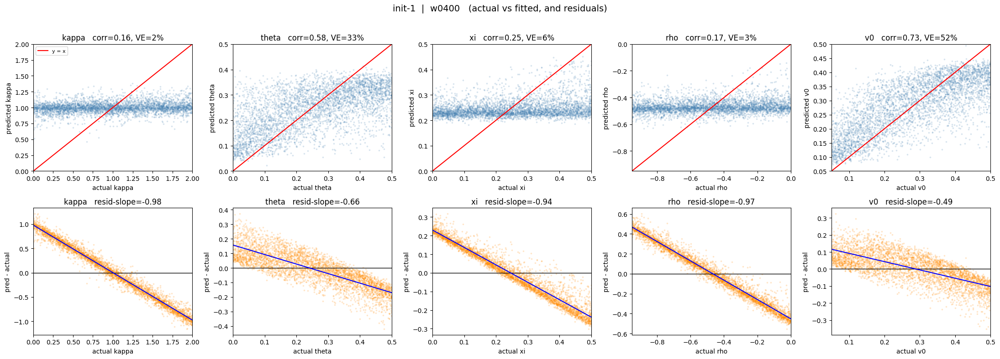

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/C_actual_vs_fitted_init1_w2000.png]


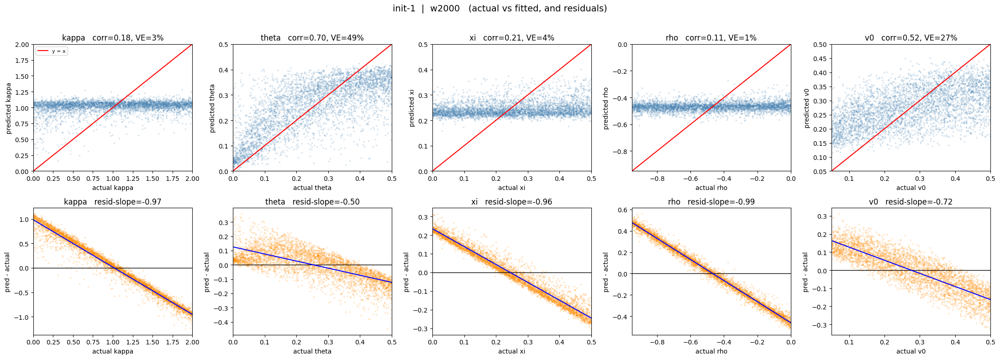

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/C_actual_vs_fitted_init100_w0400.png]


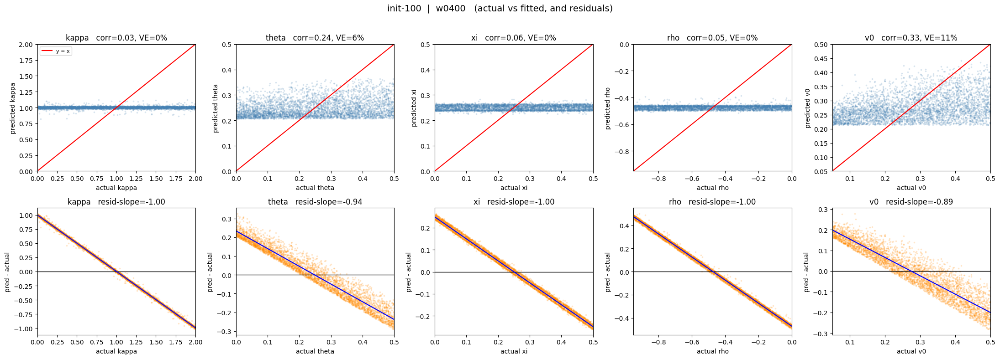

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/C_actual_vs_fitted_init100_w2000.png]


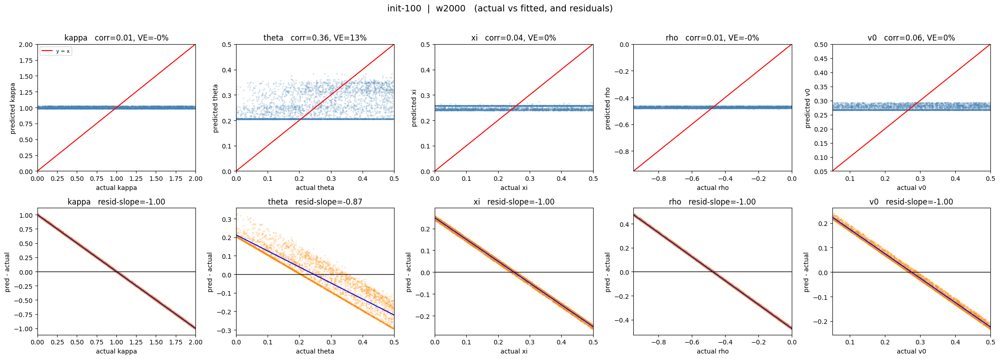

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/C_actual_vs_fitted_log_w0400.png]


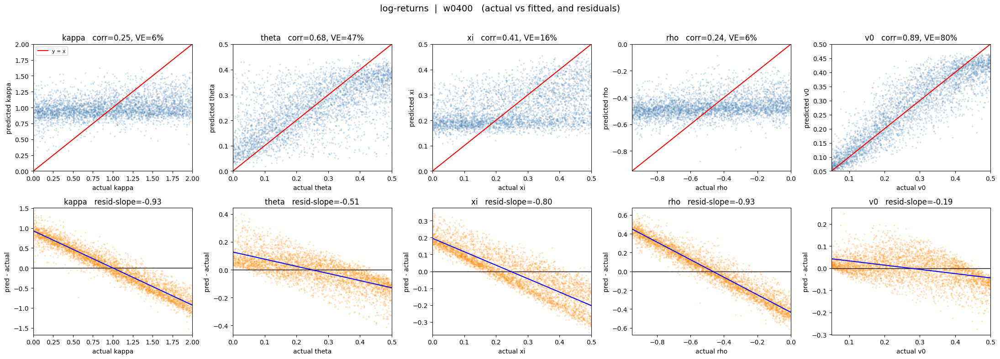

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/C_actual_vs_fitted_log_w2000.png]


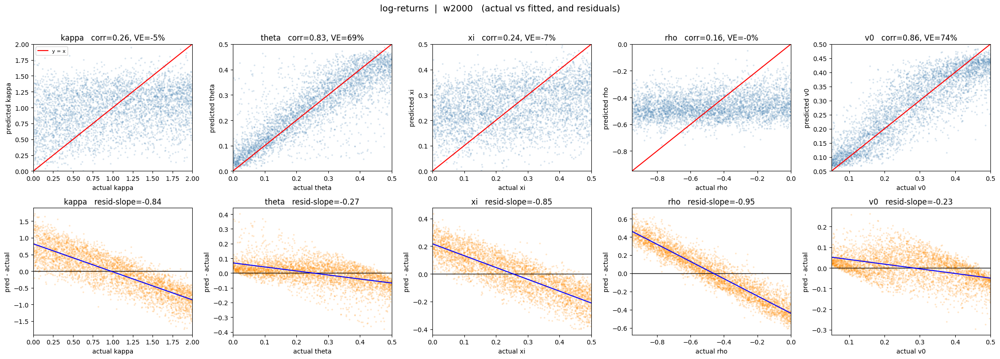

Comparison C: per-parameter fit statistics
(corr and VE across all test rows; resid_slope ~ -1 => regression to the mean / no signal)

   approach window param  corr   rmse var_explained resid_slope
     init-1  w0400 kappa 0.157 0.5703          2.4%      -0.976
     init-1  w0400 theta 0.581 0.1177         33.5%      -0.657
     init-1  w0400    xi 0.250 0.1398          6.1%      -0.938
     init-1  w0400   rho 0.168 0.2704          2.8%      -0.971
     init-1  w0400    v0 0.725 0.0897         52.3%      -0.485
     init-1  w2000 kappa 0.181 0.5682          3.2%      -0.967
     init-1  w2000 theta 0.702 0.1028         49.3%      -0.498
     init-1  w2000    xi 0.205 0.1414          4.0%      -0.958
     init-1  w2000   rho 0.113 0.2726          1.2%      -0.987
     init-1  w2000    v0 0.522 0.1108         27.2%      -0.725
   init-100  w0400 kappa 0.029 0.5773          0.0%      -0.999
   init-100  w0400 theta 0.238 0.1402          5.6%      -0.944
   init-100  w0400    xi 0.062 0.

In [ ]:
# =========================
# CELL 21.3 — Comparison C
# =========================
# Comparison C: actual vs fitted per parameter (top row) + residual vs actual
# (bottom row, regression-to-mean check). One figure per (approach, window),
# saved to OUTDIR. A per-parameter stats table (corr, RMSE, VE, resid-slope)
# is saved too.

SUBSAMPLE = 4000
rng = np.random.default_rng(0)
c_rows = []

for approach in APPROACHES:
    for window in WINDOWS:
        df = load_predictions(approach, window)
        n = len(df)
        idx = rng.choice(n, size=min(SUBSAMPLE, n), replace=False)

        fig, axes = plt.subplots(2, 5, figsize=(22, 8))
        fig.suptitle(f"{LABELS[approach]}  |  {window}   "
                     f"(actual vs fitted, and residuals)", fontsize=14)

        for j, p in enumerate(PARAMS):
            actual = df[f"actual_{p}"].values
            pred   = df[f"pred_{p}"].values
            lo, hi = BOUNDS[p]

            ax = axes[0, j]
            ax.scatter(actual[idx], pred[idx], s=3, alpha=0.15, color="steelblue")
            ax.plot([lo, hi], [lo, hi], "r-", lw=1.5, label="y = x")
            ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
            ax.set_xlabel(f"actual {p}"); ax.set_ylabel(f"predicted {p}")
            r = np.corrcoef(actual, pred)[0, 1]
            rmse = np.sqrt(np.mean((pred - actual) ** 2))
            ve = var_explained(rmse, p)
            ax.set_title(f"{p}   corr={r:.2f}, VE={ve:.0%}")
            if j == 0: ax.legend(loc="upper left", fontsize=8)

            ax2 = axes[1, j]
            resid = pred - actual
            ax2.scatter(actual[idx], resid[idx], s=3, alpha=0.15, color="darkorange")
            ax2.axhline(0, color="k", lw=1)
            b1, b0 = np.polyfit(actual, resid, 1)
            xs = np.array([lo, hi])
            ax2.plot(xs, b0 + b1 * xs, "b-", lw=1.5)
            ax2.set_xlim(lo, hi)
            ax2.set_xlabel(f"actual {p}"); ax2.set_ylabel("pred - actual")
            ax2.set_title(f"{p}   resid-slope={b1:.2f}")

            c_rows.append({"approach": LABELS[approach], "window": window,
                           "param": p, "corr": r, "rmse": rmse,
                           "var_explained": ve, "resid_slope": b1})

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        fname = os.path.join(OUTDIR, f"C_actual_vs_fitted_{approach}_{window}.png")
        fig.savefig(fname, dpi=150, bbox_inches="tight")
        print(f"[saved -> {fname}]")
        plt.show()

c_df = pd.DataFrame(c_rows)
c_df.to_csv(os.path.join(OUTDIR, "C_scatter_stats.csv"), index=False)
save_text("C_scatter_stats.txt",
          "Comparison C: per-parameter fit statistics\n"
          "(corr and VE across all test rows; resid_slope ~ -1 => "
          "regression to the mean / no signal)\n\n"
          + c_df.to_string(index=False,
                           formatters={"corr": "{:.3f}".format,
                                       "rmse": "{:.4f}".format,
                                       "var_explained": "{:.1%}".format,
                                       "resid_slope": "{:+.3f}".format}))

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/D_epoch_vs_mse.png]


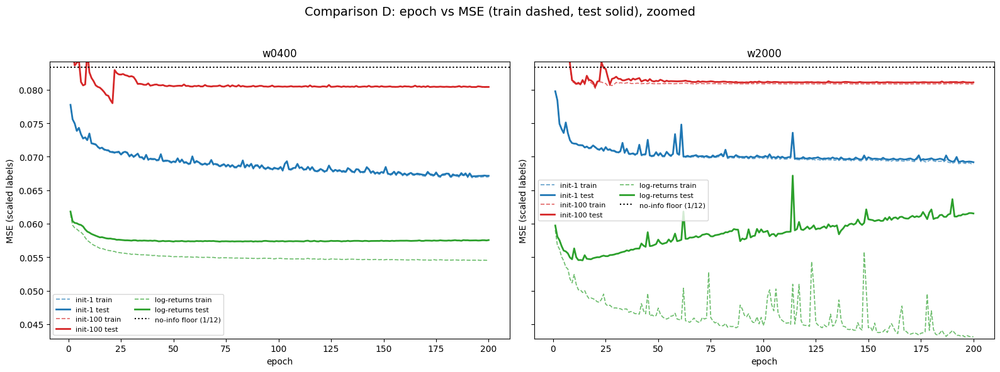

Comparison D: final MSEs and signal captured (floor MSE = 0.08333)
signal_floor_minus_test > 0 means the model beat blind mean-guessing.

   approach window final_train_mse final_test_mse signal_floor_minus_test
     init-1  w0400         0.06697        0.06714                 0.01619
     init-1  w2000         0.06893        0.06918                 0.01416
   init-100  w0400         0.08038        0.08041                 0.00292
   init-100  w2000         0.08087        0.08110                 0.00224
log-returns  w0400         0.05465        0.05755                 0.02578
log-returns  w2000         0.04312        0.06152                 0.02181
[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/D_final_mse_signal.txt]



In [ ]:
# =========================
# CELL 21.4 — Comparison D
# =========================
# Comparison D: training curves (train dashed, test solid) with the no-info
# floor. Y-axis auto-zoomed to the curves' own range so the decrease->plateau
# shape is visible. Figure + a final-MSE/signal table saved to OUTDIR.

fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)
FLOOR_MSE = 1.0 / 12.0
colors = {"init1": "tab:blue", "init100": "tab:red", "log": "tab:green"}

# ---- decide the zoom window from the data itself ----
# Ignore the first few epochs (which can spike high, esp. log-returns) when
# finding the top of the axis, so the plateau region fills the plot.
WARMUP = 3          # epochs to skip when computing the y-axis top
all_vals = []
for approach in APPROACHES:
    for window in WINDOWS:
        m = load_metrics(approach, window)
        tail = m.iloc[WARMUP:] if len(m) > WARMUP else m
        all_vals.extend(tail["train_mse"].tolist())
        all_vals.extend(tail["test_mse"].tolist())
all_vals = np.array(all_vals)
ymin = min(all_vals.min(), FLOOR_MSE) * 0.995      # a hair below the lowest curve/floor
ymax = np.percentile(all_vals, 99) * 1.02          # 99th pct trims stray high points
# make sure the floor line stays visible even if all curves sit below it
ymax = max(ymax, FLOOR_MSE * 1.01)

for ax, window in zip(axes, WINDOWS):
    for approach in APPROACHES:
        m = load_metrics(approach, window)
        c = colors[approach]
        ax.plot(m["epoch"], m["train_mse"], color=c, lw=1.2, ls="--", alpha=0.7,
                label=f"{LABELS[approach]} train")
        ax.plot(m["epoch"], m["test_mse"],  color=c, lw=2.0, ls="-",
                label=f"{LABELS[approach]} test")
    ax.axhline(FLOOR_MSE, color="k", ls=":", lw=1.5, label="no-info floor (1/12)")
    ax.set_ylim(ymin, ymax)                         # <-- the zoom
    ax.set_title(f"{window}")
    ax.set_xlabel("epoch"); ax.set_ylabel("MSE (scaled labels)")
    ax.legend(fontsize=8, ncol=2)

fig.suptitle("Comparison D: epoch vs MSE (train dashed, test solid), zoomed",
             fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
fname = os.path.join(OUTDIR, "D_epoch_vs_mse.png")
fig.savefig(fname, dpi=150, bbox_inches="tight")
print(f"[saved -> {fname}]")
plt.show()

# (table code unchanged)
d_rows = []
for approach in APPROACHES:
    for window in WINDOWS:
        s = load_summary(approach, window)
        d_rows.append({"approach": LABELS[approach], "window": window,
                       "final_train_mse": s["final_train_mse"],
                       "final_test_mse": s["final_test_mse"],
                       "signal_floor_minus_test": FLOOR_MSE - s["final_test_mse"]})
d_df = pd.DataFrame(d_rows)
d_df.to_csv(os.path.join(OUTDIR, "D_final_mse_signal.csv"), index=False)
save_text("D_final_mse_signal.txt",
          f"Comparison D: final MSEs and signal captured (floor MSE = {FLOOR_MSE:.5f})\n"
          "signal_floor_minus_test > 0 means the model beat blind mean-guessing.\n\n"
          + d_df.to_string(index=False,
                           formatters={"final_train_mse": "{:.5f}".format,
                                       "final_test_mse": "{:.5f}".format,
                                       "signal_floor_minus_test": "{:.5f}".format}))

=== Variance explained per parameter  (1 - (rmse/floor)^2) ===
0% = no better than guessing the mean; higher = more signal.

                   kappa theta    xi   rho    v0
approach    window                              
init-1      w0400   2.4% 33.5%  6.1%  2.8% 52.3%
            w2000   3.2% 49.3%  4.0%  1.2% 27.2%
init-100    w0400   0.0%  5.6%  0.4%  0.3% 11.2%
            w2000  -0.1% 13.0%  0.1% -0.0%  0.4%
log-returns w0400   5.8% 46.8% 16.4%  5.7% 80.0%
            w2000  -5.3% 69.4% -6.9% -0.3% 74.0%


=== Comparison B: approaches side by side, per window ===

--- w0400 ---
            kappa theta    xi  rho    v0
approach                                
init-1       2.4% 33.5%  6.1% 2.8% 52.3%
init-100     0.0%  5.6%  0.4% 0.3% 11.2%
log-returns  5.8% 46.8% 16.4% 5.7% 80.0%

--- w2000 ---
            kappa theta    xi   rho    v0
approach                                 
init-1       3.2% 49.3%  4.0%  1.2% 27.2%
init-100    -0.1% 13.0%  0.1% -0.0%  0.4%
log-returns -5.3% 69

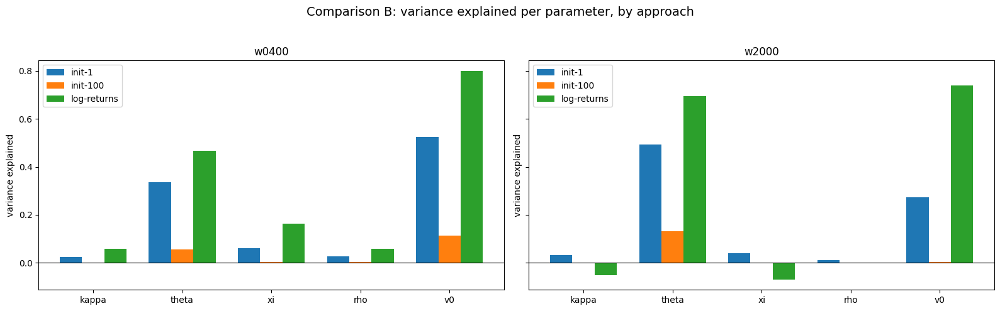

In [ ]:
# =========================
# CELL 21.5 — Comparison A and B
# =========================
# Master variance-explained table + Comparison A (window within approach),
# Comparison B (approach within window), overall ranking, and the headline
# grouped-bar figure. All saved to OUTDIR.

rows = []
for approach in APPROACHES:
    for window in WINDOWS:
        s = load_summary(approach, window)
        rmse = s["per_param_test_rmse_original_units"]
        row = {"approach": LABELS[approach], "window": window}
        for p in PARAMS:
            row[p] = var_explained(rmse[p], p)
        rows.append(row)
ve = pd.DataFrame(rows)
ve["mean_VE"] = ve[PARAMS].mean(axis=1)
ve.to_csv(os.path.join(OUTDIR, "AB_variance_explained.csv"), index=False)

def fmt_block(df, cols):
    return df[cols].to_string(
        formatters={c: "{:.1%}".format for c in cols if c != "window"
                    and c != "approach"})

# assemble one big text report
lines = []
lines.append("=== Variance explained per parameter  (1 - (rmse/floor)^2) ===")
lines.append("0% = no better than guessing the mean; higher = more signal.\n")
lines.append(ve.set_index(["approach", "window"])[PARAMS].to_string(
    formatters={p: "{:.1%}".format for p in PARAMS}))

lines.append("\n\n=== Comparison B: approaches side by side, per window ===")
for window in WINDOWS:
    lines.append(f"\n--- {window} ---")
    sub = ve[ve["window"] == window].set_index("approach")[PARAMS]
    lines.append(sub.to_string(formatters={p: "{:.1%}".format for p in PARAMS}))

lines.append("\n\n=== Comparison A: window length within each approach ===")
lines.append("(look for theta improving w0400->w2000, v0 favoring w0400)")
for approach in LABELS.values():
    lines.append(f"\n--- {approach} ---")
    sub = ve[ve["approach"] == approach].set_index("window")[PARAMS]
    lines.append(sub.to_string(formatters={p: "{:.1%}".format for p in PARAMS}))
    d = sub.loc["w2000"] - sub.loc["w0400"]
    lines.append("  w2000 - w0400 (positive = longer window helps): "
                 + str({p: f"{d[p]:+.1%}" for p in PARAMS}))

lines.append("\n\n=== Overall ranking: mean variance explained across 5 params ===")
lines.append(ve[["approach", "window", "mean_VE"]]
             .sort_values("mean_VE", ascending=False)
             .to_string(index=False,
                        formatters={"mean_VE": "{:.1%}".format}))

save_text("AB_variance_explained.txt", "\n".join(lines))

# headline grouped-bar figure
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
x = np.arange(len(PARAMS)); w = 0.25
for ax, window in zip(axes, WINDOWS):
    sub = ve[ve["window"] == window].set_index("approach")
    for k, approach in enumerate(["init-1", "init-100", "log-returns"]):
        ax.bar(x + (k - 1) * w, [sub.loc[approach, p] for p in PARAMS],
               w, label=approach)
    ax.axhline(0, color="k", lw=0.8)
    ax.set_xticks(x); ax.set_xticklabels(PARAMS)
    ax.set_title(window); ax.set_ylabel("variance explained")
    ax.legend()
fig.suptitle("Comparison B: variance explained per parameter, by approach",
             fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
fname = os.path.join(OUTDIR, "AB_variance_explained_bars.png")
fig.savefig(fname, dpi=150, bbox_inches="tight")
print(f"[saved -> {fname}]")
plt.show()

In [ ]:
import json, os, numpy as np, pandas as pd, matplotlib.pyplot as plt

BASE = "runs/week21_time_series_to_params_autoencoder"
OUTDIR = f"{BASE}/20260722-000000/figures"
os.makedirs(OUTDIR, exist_ok=True)

# framework_key -> (folder, has_dt, init_label, complexity_label)
# complexity_label is "shallow" / "complex" for the dense MLP family,
# and "cnn" for the 1D-CNN family (a different architecture, not a
# depth variant -- it still uses the dt-scaled squared-returns feature,
# so it's grouped under has_dt=True alongside the dt_* dense runs).
FRAMEWORKS = {
    "nodt_init100_shallow": ("sqret_log_returns_init100",         False, "init-100", "shallow"),
    "nodt_init1_shallow":   ("sqret_log_returns_init1",           False, "init-1",   "shallow"),
    "nodt_init100_complex": ("sqret_log_returns_init100_complex", False, "init-100", "complex"),
    "nodt_init1_complex":   ("sqret_log_returns_init1_complex",   False, "init-1",   "complex"),
    "dt_init100_shallow":   ("dt_init100",                        True,  "init-100", "shallow"),
    "dt_init1_shallow":     ("dt_init1",                          True,  "init-1",   "shallow"),
    "dt_init100_complex":   ("dt_init100_complex",                True,  "init-100", "complex"),
    "dt_init1_complex":     ("dt_init1_complex",                  True,  "init-1",   "complex"),
    "dt_init100_cnn":       ("cnn_init100",                       True,  "init-100", "cnn"),
    "dt_init1_cnn":         ("cnn_init1",                         True,  "init-1",   "cnn"),
}
WINDOWS = ["w0252", "w0504"]
PARAMS = ["kappa", "theta", "xi", "rho", "v0"]

BOUNDS = {"kappa": (0.0, 2.0), "theta": (0.0, 0.5), "xi": (0.0, 0.5),
          "rho": (-0.95, 0.0), "v0": (0.05, 0.5)}
FLOOR = {p: (hi - lo) / np.sqrt(12) for p, (lo, hi) in BOUNDS.items()}
FLOOR_MSE = 1.0 / 12.0

def path(fw_key, window, kind):
    folder = FRAMEWORKS[fw_key][0]
    return f"{BASE}/{folder}/paramnet_{window}_{kind}"

def load_summary(fw_key, window):
    with open(path(fw_key, window, "summary.json")) as f:
        return json.load(f)

def load_predictions(fw_key, window):
    return pd.read_csv(path(fw_key, window, "predictions.csv"))

def load_metrics(fw_key, window):
    return pd.read_csv(path(fw_key, window, "metrics.csv"))

def var_explained(rmse, param):
    return 1.0 - (rmse / FLOOR[param]) ** 2

def pretty(fw_key, window):
    _, has_dt, init_label, cx_label = FRAMEWORKS[fw_key]
    dt_label = "sqret/dt" if has_dt else "sqret"
    return f"{dt_label}, {init_label}, {cx_label}, {window}"

print("Frameworks:", list(FRAMEWORKS.keys()))
print("Output dir:", OUTDIR)

Frameworks: ['nodt_init100_shallow', 'nodt_init1_shallow', 'nodt_init100_complex', 'nodt_init1_complex', 'dt_init100_shallow', 'dt_init1_shallow', 'dt_init100_complex', 'dt_init1_complex', 'dt_init100_cnn', 'dt_init1_cnn']
Output dir: runs/week21_time_series_to_params_autoencoder/20260722-000000/figures


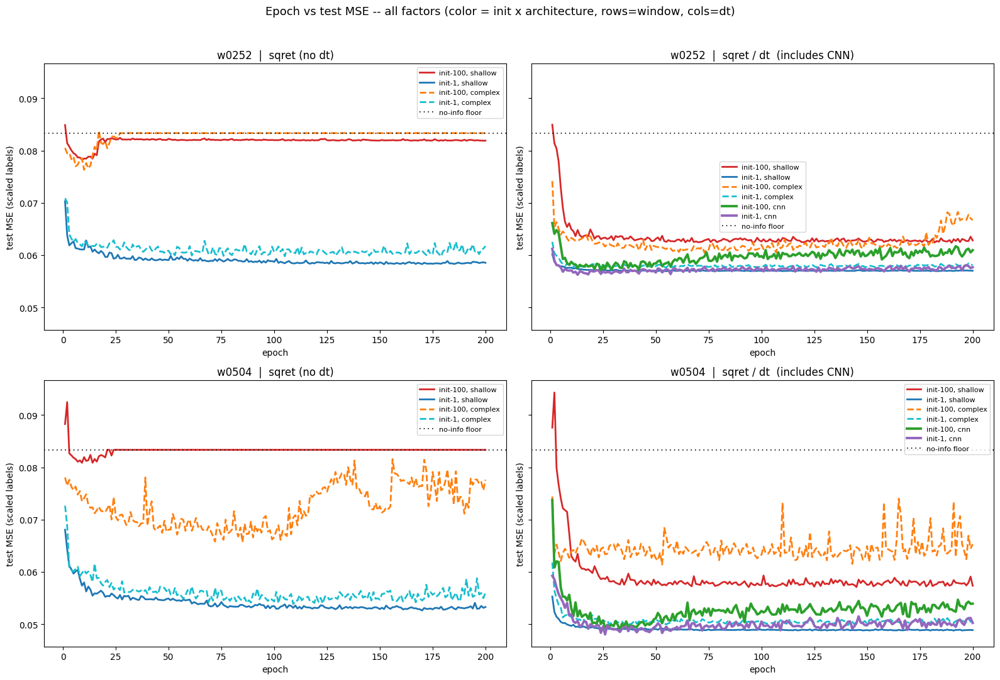

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/curves_all_factors.png]
                         framework  final_train_mse  final_test_mse
  sqret/dt, init-1, shallow, w0504         0.047680        0.048858
      sqret/dt, init-1, cnn, w0504         0.050119        0.050236
  sqret/dt, init-1, complex, w0504         0.049664        0.050581
     sqret, init-1, shallow, w0504         0.053166        0.053281
    sqret/dt, init-100, cnn, w0504         0.053813        0.053912
     sqret, init-1, complex, w0504         0.055981        0.056037
  sqret/dt, init-1, shallow, w0252         0.056086        0.057013
sqret/dt, init-100, shallow, w0504         0.057297        0.057351
      sqret/dt, init-1, cnn, w0252         0.057564        0.057673
  sqret/dt, init-1, complex, w0252         0.057457        0.058157
     sqret, init-1, shallow, w0252         0.058435        0.058528
    sqret/dt, init-100, cnn, w0252         0.060857        0.060949
     sqret, 

In [ ]:
# =========================
# CELL 21.6 — Epoch vs MSE Curves
# =========================
fig, axes = plt.subplots(2, 2, figsize=(16, 11), sharey=True)

# Color now encodes (init, architecture) jointly, so CNN lines are a
# visually distinct color family, not just a different linestyle.
color_map = {
    ("init-100", "shallow"): "tab:red",
    ("init-100", "complex"): "tab:orange",
    ("init-1",   "shallow"): "tab:blue",
    ("init-1",   "complex"): "tab:cyan",
    ("init-100", "cnn"):     "tab:green",
    ("init-1",   "cnn"):     "tab:purple",
}

for i, window in enumerate(WINDOWS):
    for j, has_dt in enumerate([False, True]):
        ax = axes[i, j]
        for fw_key, (folder, fw_dt, init_label, cx_label) in FRAMEWORKS.items():
            if fw_dt != has_dt:
                continue
            m = load_metrics(fw_key, window)
            is_cnn = cx_label == "cnn"
            ax.plot(m["epoch"], m["test_mse"],
                    color=color_map[(init_label, cx_label)],
                    lw=2.8 if is_cnn else 2,
                    ls="-" if is_cnn else ("--" if cx_label == "complex" else "-"),
                    label=f"{init_label}, {cx_label}")
        ax.axhline(FLOOR_MSE, color="k", ls=(0, (1, 3)), lw=1.2, label="no-info floor")
        dt_title = "sqret / dt  (includes CNN)" if has_dt else "sqret (no dt)"
        ax.set_title(f"{window}  |  {dt_title}")
        ax.set_xlabel("epoch"); ax.set_ylabel("test MSE (scaled labels)")
        ax.legend(fontsize=8)

fig.suptitle("Epoch vs test MSE -- all factors "
             "(color = init x architecture, rows=window, cols=dt)",
             fontsize=13)
plt.tight_layout(rect=[0, 0, 1, 0.96])
fname = os.path.join(OUTDIR, "curves_all_factors.png")
fig.savefig(fname, dpi=150, bbox_inches="tight")
plt.show()
print(f"[saved -> {fname}]")

rows = []
for fw_key in FRAMEWORKS:
    for window in WINDOWS:
        s = load_summary(fw_key, window)
        rows.append({"framework": pretty(fw_key, window),
                     "final_train_mse": s["final_train_mse"],
                     "final_test_mse": s["final_test_mse"]})
curve_end_df = pd.DataFrame(rows).sort_values("final_test_mse")
curve_end_df.to_csv(os.path.join(OUTDIR, "curves_final_mse.csv"), index=False)
print(curve_end_df.to_string(index=False))

In [ ]:
# =========================
# CELL 21.7 — RMSE per parameter table
# =========================
rows = []
for fw_key, (folder, has_dt, init_label, cx_label) in FRAMEWORKS.items():
    for window in WINDOWS:
        s = load_summary(fw_key, window)
        rmse = s["per_param_test_rmse_original_units"]
        row = {"dt": "sqret/dt" if has_dt else "sqret", "init": init_label,
              "complexity": cx_label, "window": window}
        for p in PARAMS:
            row[f"{p}_rmse"] = rmse[p]
            row[f"{p}_VE"] = var_explained(rmse[p], p)
        rows.append(row)
tbl = pd.DataFrame(rows)
tbl["mean_VE"] = tbl[[f"{p}_VE" for p in PARAMS]].mean(axis=1)
tbl = tbl.sort_values("mean_VE", ascending=False)

rmse_cols = ["dt", "init", "complexity", "window"] + [f"{p}_rmse" for p in PARAMS]
tbl[rmse_cols].to_csv(os.path.join(OUTDIR, "table_rmse_original_units.csv"), index=False)

ve_cols = ["dt", "init", "complexity", "window"] + [f"{p}_VE" for p in PARAMS] + ["mean_VE"]
tbl[ve_cols].to_csv(os.path.join(OUTDIR, "table_variance_explained.csv"), index=False)

text_lines = []
text_lines.append("=== Test RMSE per parameter, original units (all runs) ===\n")
text_lines.append(tbl[rmse_cols].to_string(
    index=False, formatters={f"{p}_rmse": "{:.4f}".format for p in PARAMS}))
text_lines.append("\n\n=== Variance explained per parameter "
                  "(1 - (rmse/floor)^2), ranked by mean ===\n")
text_lines.append(tbl[ve_cols].to_string(
    index=False, formatters={c: "{:.1%}".format
                             for c in ve_cols if c not in
                             ("dt", "init", "complexity", "window")}))
report = "\n".join(text_lines)
with open(os.path.join(OUTDIR, "table_summary.txt"), "w") as f:
    f.write(report)
print(report)

=== Test RMSE per parameter, original units (all runs) ===

      dt     init complexity window kappa_rmse theta_rmse xi_rmse rho_rmse v0_rmse
sqret/dt   init-1    shallow  w0504     0.5523     0.0979  0.1066   0.2505  0.0547
sqret/dt   init-1        cnn  w0504     0.5502     0.1004  0.1137   0.2391  0.0638
sqret/dt   init-1    complex  w0504     0.5542     0.1013  0.1090   0.2503  0.0607
   sqret   init-1    shallow  w0504     0.5552     0.0985  0.1205   0.2637  0.0558
sqret/dt init-100        cnn  w0504     0.5544     0.1037  0.1225   0.2377  0.0740
   sqret   init-1    complex  w0504     0.5581     0.1041  0.1269   0.2634  0.0598
sqret/dt   init-1    shallow  w0252     0.5608     0.1139  0.1262   0.2613  0.0555
sqret/dt init-100    shallow  w0504     0.5614     0.0999  0.1291   0.2742  0.0605
sqret/dt   init-1        cnn  w0252     0.5605     0.1144  0.1276   0.2555  0.0638
sqret/dt   init-1    complex  w0252     0.5620     0.1149  0.1273   0.2615  0.0609
   sqret   init-1    shallo

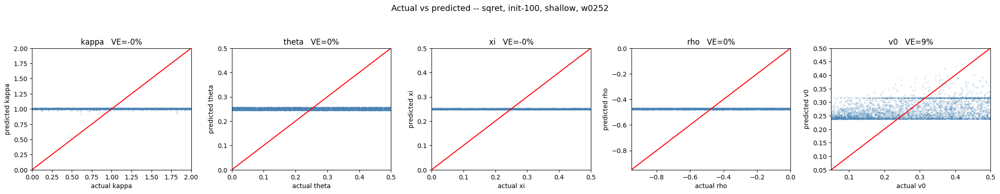

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init100_shallow_w0252.png]


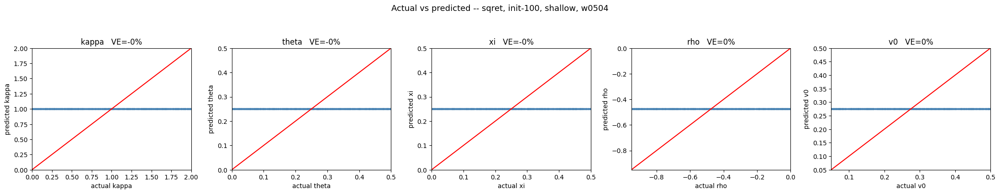

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init100_shallow_w0504.png]


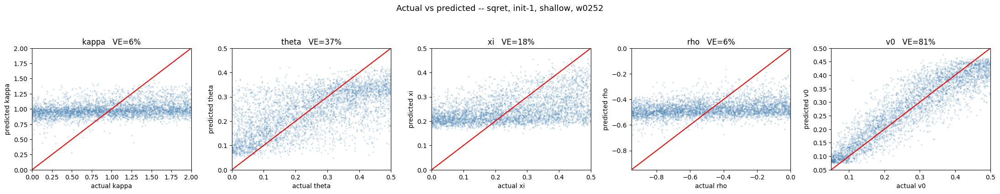

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init1_shallow_w0252.png]


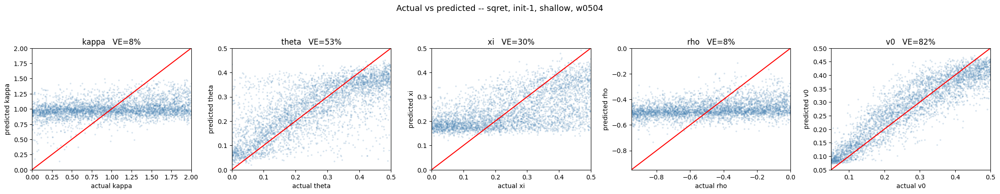

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init1_shallow_w0504.png]


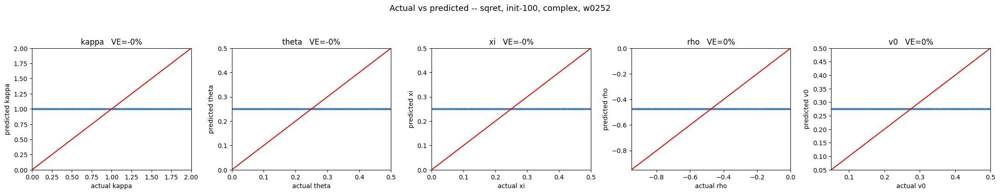

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init100_complex_w0252.png]


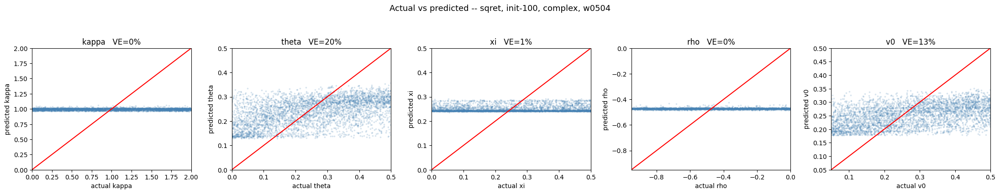

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init100_complex_w0504.png]


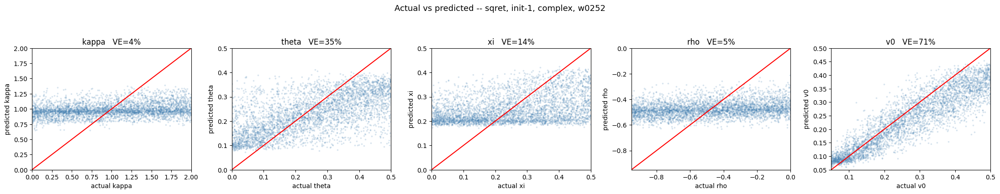

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init1_complex_w0252.png]


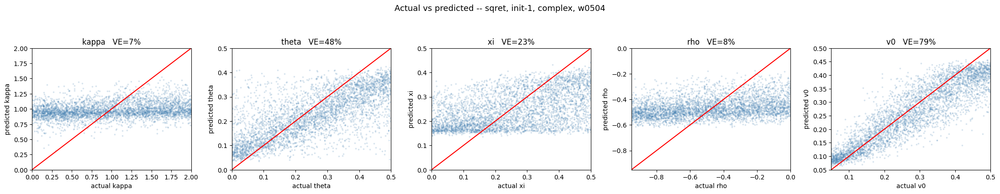

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_nodt_init1_complex_w0504.png]


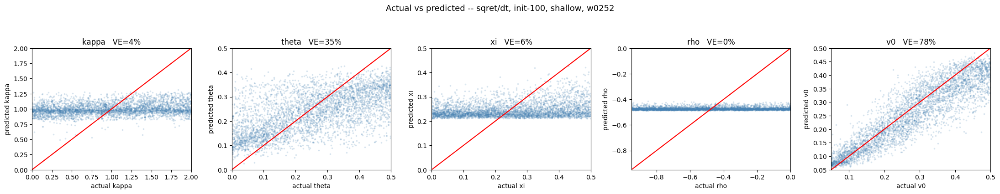

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init100_shallow_w0252.png]


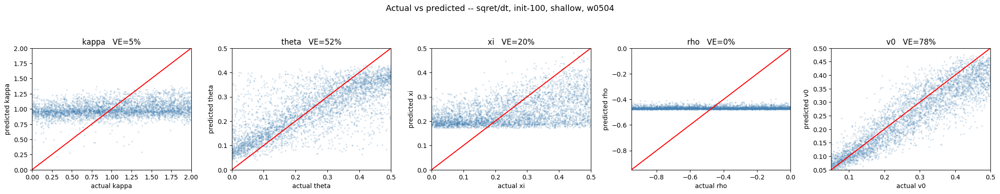

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init100_shallow_w0504.png]


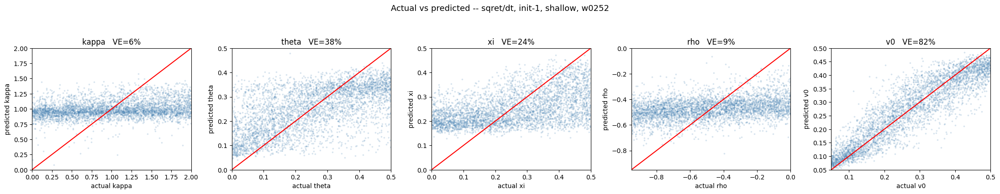

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init1_shallow_w0252.png]


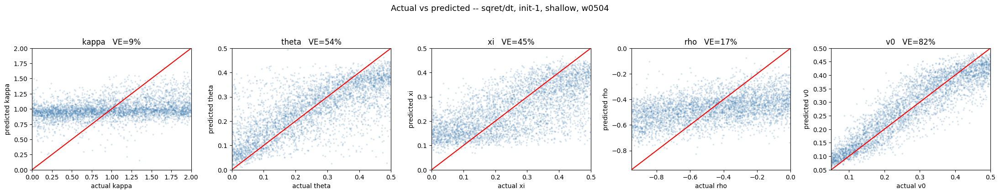

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init1_shallow_w0504.png]


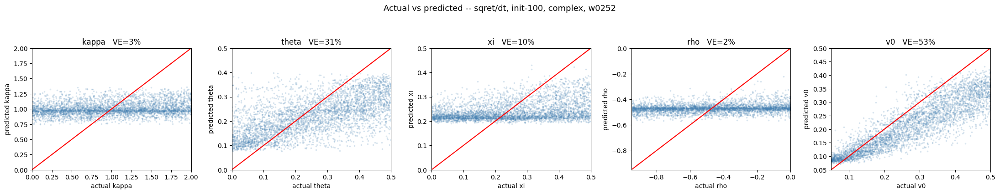

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init100_complex_w0252.png]


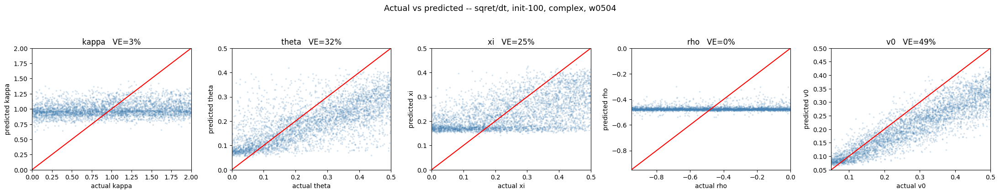

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init100_complex_w0504.png]


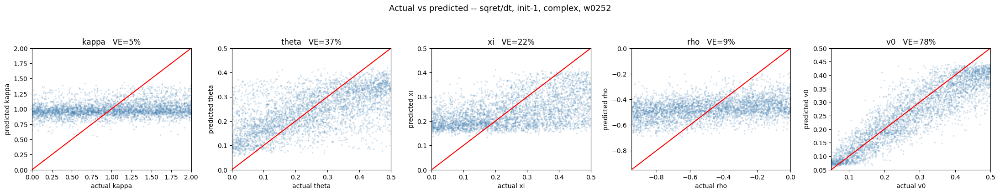

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init1_complex_w0252.png]


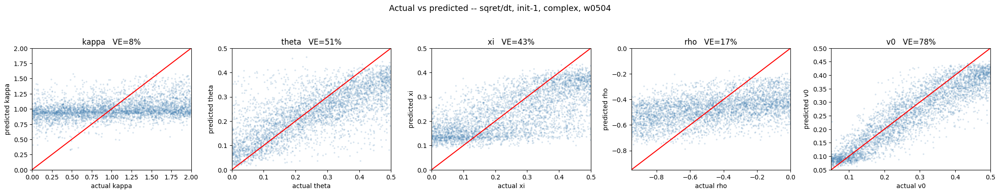

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init1_complex_w0504.png]


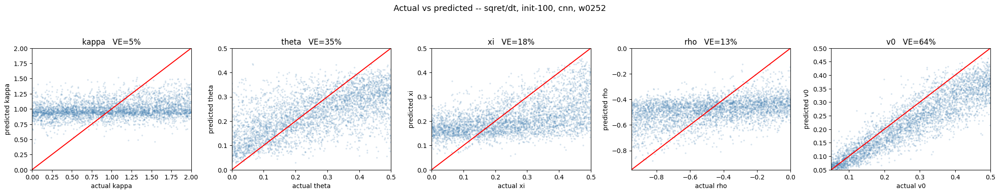

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init100_cnn_w0252.png]


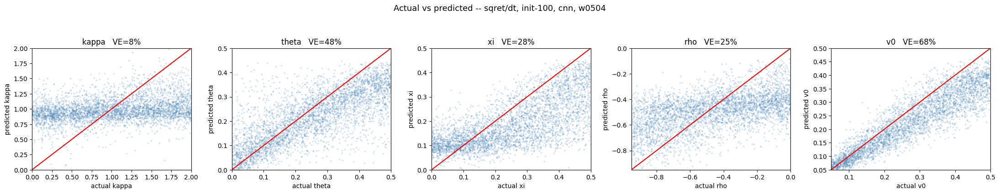

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init100_cnn_w0504.png]


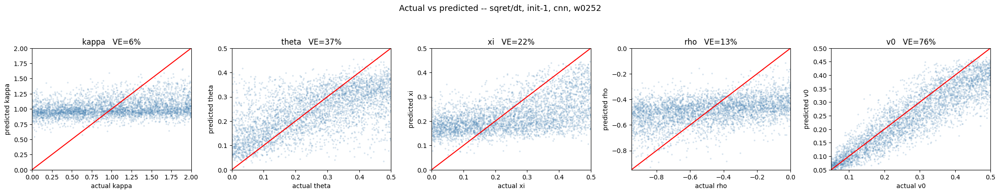

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init1_cnn_w0252.png]


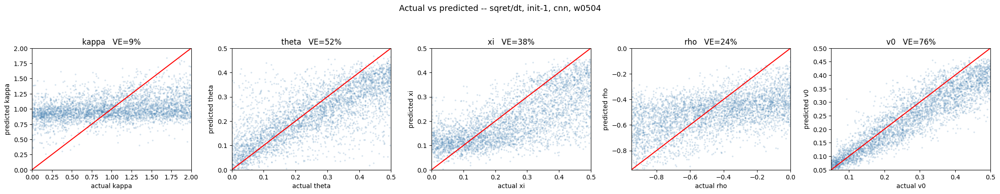

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_dt_init1_cnn_w0504.png]

All predicted-vs-actual figures saved.


In [ ]:
# =========================
# CELL 21.8 — Predicted vs Actual Graphs
# =========================
SUBSAMPLE = 4000
rng = np.random.default_rng(0)

for fw_key, (folder, has_dt, init_label, cx_label) in FRAMEWORKS.items():
    for window in WINDOWS:
        df = load_predictions(fw_key, window)
        n = len(df)
        idx = rng.choice(n, size=min(SUBSAMPLE, n), replace=False)

        fig, axes = plt.subplots(1, 5, figsize=(22, 4.3))
        fig.suptitle(f"Actual vs predicted -- {pretty(fw_key, window)}",
                     fontsize=13)

        for j, p in enumerate(PARAMS):
            actual = df[f"actual_{p}"].values
            pred   = df[f"pred_{p}"].values
            lo, hi = BOUNDS[p]

            ax = axes[j]
            ax.scatter(actual[idx], pred[idx], s=3, alpha=0.15, color="steelblue")
            ax.plot([lo, hi], [lo, hi], "r-", lw=1.5)
            ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
            ax.set_xlabel(f"actual {p}"); ax.set_ylabel(f"predicted {p}")
            rmse = np.sqrt(np.mean((pred - actual) ** 2))
            ve = var_explained(rmse, p)
            ax.set_title(f"{p}   VE={ve:.0%}")

        plt.tight_layout(rect=[0, 0, 1, 0.92])
        fname = os.path.join(
            OUTDIR, f"predvsactual_{fw_key}_{window}.png")
        fig.savefig(fname, dpi=140, bbox_inches="tight")
        plt.show()      # display inline in the notebook
        plt.close(fig)  # then free the figure
        print(f"[saved -> {fname}]")

print("\nAll predicted-vs-actual figures saved.")

In [ ]:
# =========================
# CELL 21.8b — Setup: CNN v1 (Job 43/44) vs CNN v2 (Job 45/46)
# =========================
import json, os, numpy as np, pandas as pd, matplotlib.pyplot as plt

BASE = "runs/week21_time_series_to_params_autoencoder"
OUTDIR = f"{BASE}/20260722-000000/figures"
os.makedirs(OUTDIR, exist_ok=True)

# framework_key -> (folder, init_label, version_label)
# version: "v1" = Job 43/44 (avg-pool only, 6 conv layers, ~127-day RF)
#          "v2" = Job 45/46 (avg+max concat pool, 9 conv layers, ~1023-day RF)
FRAMEWORKS = {
    "cnn_v1_init100": ("cnn_init100",         "init-100", "v1 (avg-pool, 6 layers)"),
    "cnn_v1_init1":   ("cnn_init1",           "init-1",   "v1 (avg-pool, 6 layers)"),
    "cnn_v2_init100": ("cnn_tweaked_init100", "init-100", "v2 (avg+max, 9 layers)"),
    "cnn_v2_init1":   ("cnn_tweaked_init1",   "init-1",   "v2 (avg+max, 9 layers)"),
}
WINDOWS = ["w0252", "w0504"]
PARAMS = ["kappa", "theta", "xi", "rho", "v0"]

BOUNDS = {"kappa": (0.0, 2.0), "theta": (0.0, 0.5), "xi": (0.0, 0.5),
          "rho": (-0.95, 0.0), "v0": (0.05, 0.5)}
FLOOR = {p: (hi - lo) / np.sqrt(12) for p, (lo, hi) in BOUNDS.items()}
FLOOR_MSE = 1.0 / 12.0

def path(fw_key, window, kind):
    folder = FRAMEWORKS[fw_key][0]
    return f"{BASE}/{folder}/paramnet_{window}_{kind}"

def load_summary(fw_key, window):
    with open(path(fw_key, window, "summary.json")) as f:
        return json.load(f)

def load_predictions(fw_key, window):
    return pd.read_csv(path(fw_key, window, "predictions.csv"))

def load_metrics(fw_key, window):
    return pd.read_csv(path(fw_key, window, "metrics.csv"))

def var_explained(rmse, param):
    return 1.0 - (rmse / FLOOR[param]) ** 2

def pretty(fw_key, window):
    _, init_label, version_label = FRAMEWORKS[fw_key]
    return f"{version_label}, {init_label}, {window}"

print("Frameworks:", list(FRAMEWORKS.keys()))
print("Output dir:", OUTDIR)

Frameworks: ['cnn_v1_init100', 'cnn_v1_init1', 'cnn_v2_init100', 'cnn_v2_init1']
Output dir: runs/week21_time_series_to_params_autoencoder/20260722-000000/figures


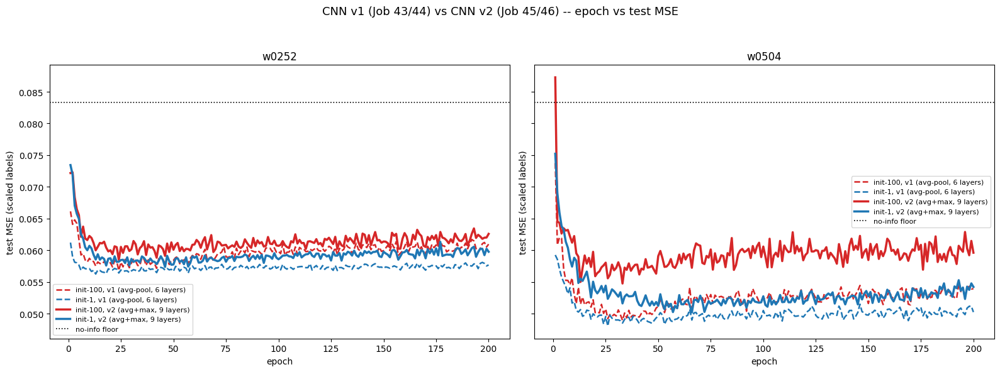

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/curves_cnn_v1_vs_v2.png]
                               framework  final_train_mse  final_test_mse
  v1 (avg-pool, 6 layers), init-1, w0504         0.050119        0.050236
v1 (avg-pool, 6 layers), init-100, w0504         0.053813        0.053912
   v2 (avg+max, 9 layers), init-1, w0504         0.054018        0.054208
  v1 (avg-pool, 6 layers), init-1, w0252         0.057564        0.057673
 v2 (avg+max, 9 layers), init-100, w0504         0.059448        0.059604
   v2 (avg+max, 9 layers), init-1, w0252         0.059598        0.059757
v1 (avg-pool, 6 layers), init-100, w0252         0.060857        0.060949
 v2 (avg+max, 9 layers), init-100, w0252         0.062457        0.062579


In [ ]:
# =========================
# CELL 21.9 — Epoch vs MSE Curves for tweaked
# =========================
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)
color_by_init = {"init-100": "tab:red", "init-1": "tab:blue"}
style_by_version = {"v1 (avg-pool, 6 layers)": "--", "v2 (avg+max, 9 layers)": "-"}

for ax, window in zip(axes, WINDOWS):
    for fw_key, (folder, init_label, version_label) in FRAMEWORKS.items():
        m = load_metrics(fw_key, window)
        lw = 2.5 if "v2" in version_label else 1.8
        ax.plot(m["epoch"], m["test_mse"],
                color=color_by_init[init_label],
                linestyle=style_by_version[version_label],
                lw=lw, label=f"{init_label}, {version_label}")
    ax.axhline(FLOOR_MSE, color="k", ls=":", lw=1.2, label="no-info floor")
    ax.set_title(window)
    ax.set_xlabel("epoch"); ax.set_ylabel("test MSE (scaled labels)")
    ax.legend(fontsize=8)

fig.suptitle("CNN v1 (Job 43/44) vs CNN v2 (Job 45/46) -- epoch vs test MSE",
             fontsize=13)
plt.tight_layout(rect=[0, 0, 1, 0.94])
fname = os.path.join(OUTDIR, "curves_cnn_v1_vs_v2.png")
fig.savefig(fname, dpi=150, bbox_inches="tight")
plt.show()
print(f"[saved -> {fname}]")

rows = []
for fw_key in FRAMEWORKS:
    for window in WINDOWS:
        s = load_summary(fw_key, window)
        rows.append({"framework": pretty(fw_key, window),
                     "final_train_mse": s["final_train_mse"],
                     "final_test_mse": s["final_test_mse"]})
curve_end_df = pd.DataFrame(rows).sort_values("final_test_mse")
curve_end_df.to_csv(os.path.join(OUTDIR, "curves_cnn_v1_vs_v2_final_mse.csv"), index=False)
print(curve_end_df.to_string(index=False))

In [ ]:
# =========================
# CELL 21.10 — RMSE table for tweaked
# =========================
rows = []
for fw_key, (folder, init_label, version_label) in FRAMEWORKS.items():
    for window in WINDOWS:
        s = load_summary(fw_key, window)
        rmse = s["per_param_test_rmse_original_units"]
        row = {"version": version_label, "init": init_label, "window": window}
        for p in PARAMS:
            row[f"{p}_rmse"] = rmse[p]
            row[f"{p}_VE"] = var_explained(rmse[p], p)
        rows.append(row)
tbl = pd.DataFrame(rows)
tbl["mean_VE"] = tbl[[f"{p}_VE" for p in PARAMS]].mean(axis=1)
tbl = tbl.sort_values(["init", "window", "version"])

rmse_cols = ["version", "init", "window"] + [f"{p}_rmse" for p in PARAMS]
tbl[rmse_cols].to_csv(os.path.join(OUTDIR, "table_cnn_v1_vs_v2_rmse.csv"), index=False)

ve_cols = ["version", "init", "window"] + [f"{p}_VE" for p in PARAMS] + ["mean_VE"]
tbl[ve_cols].to_csv(os.path.join(OUTDIR, "table_cnn_v1_vs_v2_VE.csv"), index=False)

text_lines = []
text_lines.append("=== CNN v1 vs v2: test RMSE per parameter, original units ===\n")
text_lines.append(tbl[rmse_cols].to_string(
    index=False, formatters={f"{p}_rmse": "{:.4f}".format for p in PARAMS}))
text_lines.append("\n\n=== CNN v1 vs v2: variance explained per parameter "
                  "(1 - (rmse/floor)^2) ===\n")
text_lines.append(tbl[ve_cols].to_string(
    index=False, formatters={c: "{:.1%}".format
                             for c in ve_cols if c not in
                             ("version", "init", "window")}))

# quick delta view: v2 minus v1, per (init, window), per parameter
delta_rows = []
for init_label in ["init-100", "init-1"]:
    for window in WINDOWS:
        v1 = tbl[(tbl.init == init_label) & (tbl.window == window)
                & (tbl.version.str.startswith("v1"))].iloc[0]
        v2 = tbl[(tbl.init == init_label) & (tbl.window == window)
                & (tbl.version.str.startswith("v2"))].iloc[0]
        d = {"init": init_label, "window": window}
        for p in PARAMS:
            d[f"{p}_VE_delta"] = v2[f"{p}_VE"] - v1[f"{p}_VE"]
        delta_rows.append(d)
delta_df = pd.DataFrame(delta_rows)
delta_df.to_csv(os.path.join(OUTDIR, "table_cnn_v1_vs_v2_VE_delta.csv"), index=False)
text_lines.append("\n\n=== v2 minus v1: change in variance explained "
                  "(positive = v2 improved) ===\n")
text_lines.append(delta_df.to_string(
    index=False, formatters={f"{p}_VE_delta": "{:+.1%}".format for p in PARAMS}))

report = "\n".join(text_lines)
with open(os.path.join(OUTDIR, "table_cnn_v1_vs_v2_summary.txt"), "w") as f:
    f.write(report)
print(report)

=== CNN v1 vs v2: test RMSE per parameter, original units ===

                version     init window kappa_rmse theta_rmse xi_rmse rho_rmse v0_rmse
v1 (avg-pool, 6 layers)   init-1  w0252     0.5605     0.1144  0.1276   0.2555  0.0638
 v2 (avg+max, 9 layers)   init-1  w0252     0.5621     0.1164  0.1285   0.2548  0.0747
v1 (avg-pool, 6 layers)   init-1  w0504     0.5502     0.1004  0.1137   0.2391  0.0638
 v2 (avg+max, 9 layers)   init-1  w0504     0.5537     0.1041  0.1142   0.2404  0.0840
v1 (avg-pool, 6 layers) init-100  w0252     0.5628     0.1166  0.1311   0.2554  0.0782
 v2 (avg+max, 9 layers) init-100  w0252     0.5650     0.1181  0.1326   0.2566  0.0830
v1 (avg-pool, 6 layers) init-100  w0504     0.5544     0.1037  0.1225   0.2377  0.0740
 v2 (avg+max, 9 layers) init-100  w0504     0.5579     0.1129  0.1242   0.2388  0.0947


=== CNN v1 vs v2: variance explained per parameter (1 - (rmse/floor)^2) ===

                version     init window kappa_VE theta_VE xi_VE rho_VE v0_V

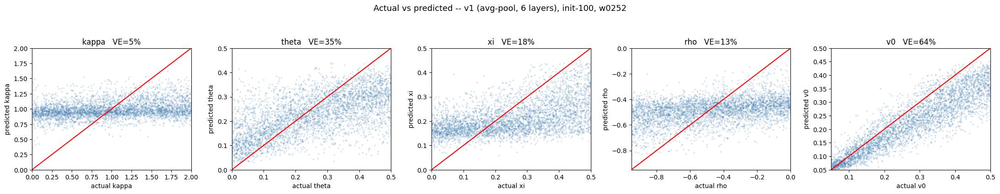

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v1_init100_w0252.png]


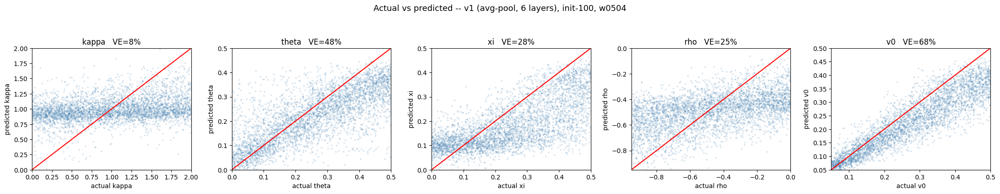

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v1_init100_w0504.png]


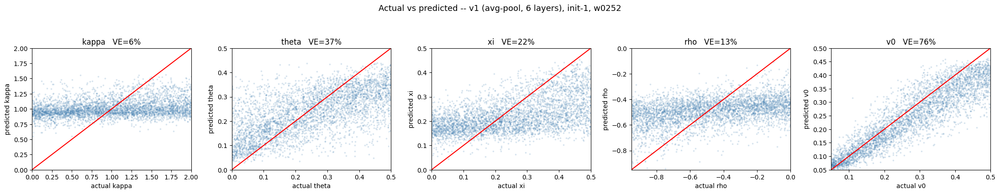

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v1_init1_w0252.png]


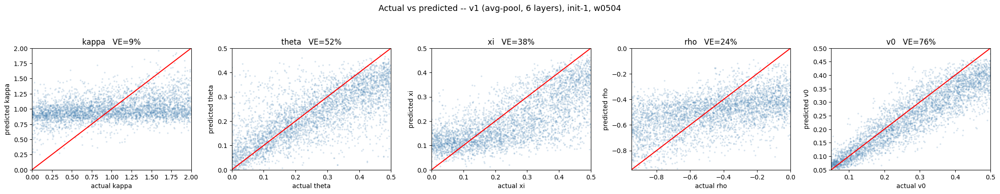

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v1_init1_w0504.png]


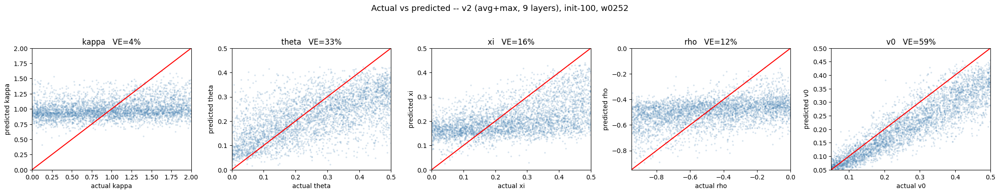

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v2_init100_w0252.png]


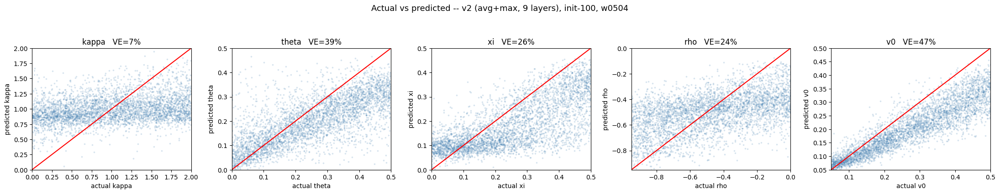

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v2_init100_w0504.png]


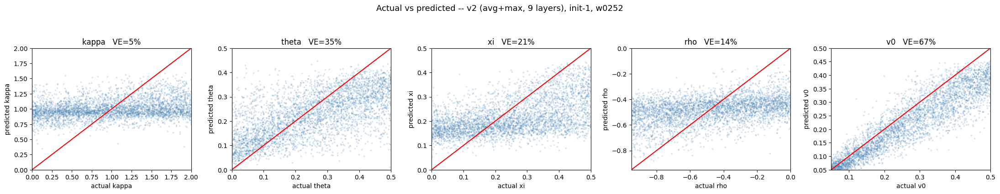

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v2_init1_w0252.png]


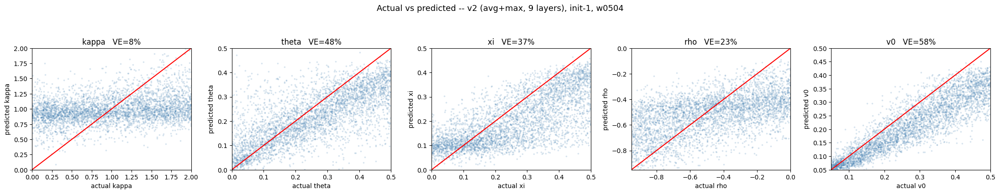

[saved -> runs/week21_time_series_to_params_autoencoder/20260722-000000/figures/predvsactual_cnn_v2_init1_w0504.png]

All CNN v1-vs-v2 predicted-vs-actual figures saved.


In [ ]:
# =========================
# CELL 21.11 — Predicted vs Actual for tweaked
# =========================
SUBSAMPLE = 4000
rng = np.random.default_rng(0)

for fw_key, (folder, init_label, version_label) in FRAMEWORKS.items():
    for window in WINDOWS:
        df = load_predictions(fw_key, window)
        n = len(df)
        idx = rng.choice(n, size=min(SUBSAMPLE, n), replace=False)

        fig, axes = plt.subplots(1, 5, figsize=(22, 4.3))
        fig.suptitle(f"Actual vs predicted -- {pretty(fw_key, window)}",
                     fontsize=13)

        for j, p in enumerate(PARAMS):
            actual = df[f"actual_{p}"].values
            pred   = df[f"pred_{p}"].values
            lo, hi = BOUNDS[p]

            ax = axes[j]
            ax.scatter(actual[idx], pred[idx], s=3, alpha=0.15, color="steelblue")
            ax.plot([lo, hi], [lo, hi], "r-", lw=1.5)
            ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
            ax.set_xlabel(f"actual {p}"); ax.set_ylabel(f"predicted {p}")
            rmse = np.sqrt(np.mean((pred - actual) ** 2))
            ve = var_explained(rmse, p)
            ax.set_title(f"{p}   VE={ve:.0%}")

        plt.tight_layout(rect=[0, 0, 1, 0.92])
        fname = os.path.join(
            OUTDIR, f"predvsactual_{fw_key}_{window}.png")
        fig.savefig(fname, dpi=140, bbox_inches="tight")
        plt.show()
        plt.close(fig)
        print(f"[saved -> {fname}]")

print("\nAll CNN v1-vs-v2 predicted-vs-actual figures saved.")

In [4]:
# =========================
# CELL 21.12 — Summary: CNN Architecture (Job 43/44) + Next Steps
# =========================
SUMMARY_TEXT = """
WEEK 21 -- CNN EXPERIMENTS: BRIEF SUMMARY
============================================

WHAT WAS IMPLEMENTED
---------------------
CNN: 2 input channels (price; annualized daily variance r_t^2/dt,
dt=1/252 matching the Euler discretization step). kernel_size=3,
base_channels=32, 6 dilated conv layers (dilation doubling per layer),
global average pooling -> 6-dim latent -> dense head -> 5 params.
Also tested: dense-model depth (shallow vs +6 layers/side) and the
dt-normalized squared-log-return feature.

RESULTS
-------
Added depth to the dense MLP did not help -- slightly hurt. The best
single change was to the INPUT (dividing squared returns by dt to
annualize), not the architecture -- improved theta and v0. Kappa
remains unlearned under every setting tried. The CNN's standout result:
RHO achieved its lowest RMSE under any framework tested -- the CNN
specifically helps this parameter.

NEXT STEPS (3, from this meeting)
------------------------------------
1. Vary kernel_size (try larger, ~10) -- current size-3 window is close
   to a single observation; may miss time-varying structure.
2. Explore alternative pooling, or replacing pooling with feed-forward
   compression -- global average pooling may over-dilute signal.
3. Implement short-term vs long-term rolling realized-variance channels
   (e.g. RV5, RV60) to expose volatility bursts and reversion speed
   (the RV_short-vs-RV_long gap closing over time). Confirmed
   computable identically on real market data.
"""

print(SUMMARY_TEXT)


WEEK 21 -- CNN EXPERIMENTS: BRIEF SUMMARY

WHAT WAS IMPLEMENTED
---------------------
CNN: 2 input channels (price; annualized daily variance r_t^2/dt,
dt=1/252 matching the Euler discretization step). kernel_size=3,
base_channels=32, 6 dilated conv layers (dilation doubling per layer),
global average pooling -> 6-dim latent -> dense head -> 5 params.
Also tested: dense-model depth (shallow vs +6 layers/side) and the
dt-normalized squared-log-return feature.

RESULTS
-------
Added depth to the dense MLP did not help -- slightly hurt. The best
single change was to the INPUT (dividing squared returns by dt to
annualize), not the architecture -- improved theta and v0. Kappa
remains unlearned under every setting tried. The CNN's standout result:
RHO achieved its lowest RMSE under any framework tested -- the CNN
specifically helps this parameter.

NEXT STEPS (3, from this meeting)
------------------------------------
1. Vary kernel_size (try larger, ~10) -- current size-3 window is close
 